<a href="https://colab.research.google.com/github/mnnit3007/ML_Supervised_Learning_Classification/blob/main/Mid_Course_Assessment_ML_Case_Study(Loan_default_prediction).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Banking and Financial Services industry(BFSI)-Loan Default Prediction**

**Understand the Industry**

The **BFSI (Banking, Financial Services, and Insurance) industry** is a significant segment of the Indian economy, encompassing all banking institutions, financial services companies, and insurance firms.
The main strength of the Indian BFSI sector lies in its **ability to deliver volumes since India being a large and diverse country**, offers the benefits of a humungous customer base. However, given the **informal and unstructured lending and banking processes, coupled with rising technological penetration expose the sector to frauds and defaults** resulting into **rising bad loans and the NPAs (Non Performing Assets)** which can bring down the banking sector if they are not managed in a structured manner.

**The Problem**

The problem at hand is to **predict the possibility of loan default based on provided dataset.It can be classified as a supervised learning(classification) problem.**

**Business Objective**

Banks earn a major revenue from lending loans. But it is often associated with risk. The borrower's may default on the loan. To mitigate this issue, the banks have decided to **use Machine Learning to overcome this issue. They have collected past data on the loan borrowers.**

**Desired Outcome**
**To classify if any new borrower is likely to default or not.**

**Constraints & Limitations**
1. Computational Power
2. Budget
3. Data Availability

**Evaluation Metrics**
1. Accuracy
2. Precision
3. Recall
4. F1 Score
5. log_loss
6. AUC_ROC   


# **Data Collection**

**Source Identification:**

Dataset has been sourced from**Kaggle.It features at top spot** in kaggle hotness index in its category.

In [ ]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Mounting drive
from google.colab import drive
drive.mount('/content/drive')
path="/content/drive/My Drive/Loan_Default.csv"


Mounted at /content/drive


In [ ]:
#Loading the dataset
df=pd.read_csv(path)
df.head()

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,...,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,...,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,...,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,...,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0


In [ ]:
#Last five rows
df.tail()

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
148665,173555,2019,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,...,CIB,659,EXP,55-64,to_inst,71.792763,south,direct,0,48.0
148666,173556,2019,cf,Male,nopre,type1,p1,l1,nopc,nob/c,...,CIB,569,CIB,25-34,not_inst,74.428934,south,direct,0,15.0
148667,173557,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,...,CIB,702,EXP,45-54,not_inst,61.332418,North,direct,0,49.0
148668,173558,2019,cf,Female,nopre,type1,p4,l1,nopc,nob/c,...,EXP,737,EXP,55-64,to_inst,70.683453,North,direct,0,29.0
148669,173559,2019,cf,Female,nopre,type1,p3,l1,nopc,nob/c,...,CIB,830,CIB,45-54,not_inst,72.849462,North,direct,0,44.0


**Data Volume Required:**

The no. of records in the dataset is sufficient for the purpose. The dataset has 1,48,670 records and 34 features.

In [ ]:
#No. of records
len(df)

148670

In [ ]:
#Shape of Dataset
df.shape

(148670, 34)

In [ ]:
#Features in the dataset
df.columns

Index(['ID', 'year', 'loan_limit', 'Gender', 'approv_in_adv', 'loan_type',
       'loan_purpose', 'Credit_Worthiness', 'open_credit',
       'business_or_commercial', 'loan_amount', 'rate_of_interest',
       'Interest_rate_spread', 'Upfront_charges', 'term', 'Neg_ammortization',
       'interest_only', 'lump_sum_payment', 'property_value',
       'construction_type', 'occupancy_type', 'Secured_by', 'total_units',
       'income', 'credit_type', 'Credit_Score', 'co-applicant_credit_type',
       'age', 'submission_of_application', 'LTV', 'Region', 'Security_Type',
       'Status', 'dtir1'],
      dtype='object')

**Data Types:**

The dataset is labeled. The datatypes of various features is as follows.

In [ ]:
#Datatypes of features
df.dtypes

ID                             int64
year                           int64
loan_limit                    object
Gender                        object
approv_in_adv                 object
loan_type                     object
loan_purpose                  object
Credit_Worthiness             object
open_credit                   object
business_or_commercial        object
loan_amount                    int64
rate_of_interest             float64
Interest_rate_spread         float64
Upfront_charges              float64
term                         float64
Neg_ammortization             object
interest_only                 object
lump_sum_payment              object
property_value               float64
construction_type             object
occupancy_type                object
Secured_by                    object
total_units                   object
income                       float64
credit_type                   object
Credit_Score                   int64
co-applicant_credit_type      object
a

**Data Quality:**

Address errors, bias, and maintain consistency within the data.


In [ ]:
#Dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148670 entries, 0 to 148669
Data columns (total 34 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ID                         148670 non-null  int64  
 1   year                       148670 non-null  int64  
 2   loan_limit                 145326 non-null  object 
 3   Gender                     148670 non-null  object 
 4   approv_in_adv              147762 non-null  object 
 5   loan_type                  148670 non-null  object 
 6   loan_purpose               148536 non-null  object 
 7   Credit_Worthiness          148670 non-null  object 
 8   open_credit                148670 non-null  object 
 9   business_or_commercial     148670 non-null  object 
 10  loan_amount                148670 non-null  int64  
 11  rate_of_interest           112231 non-null  float64
 12  Interest_rate_spread       112031 non-null  float64
 13  Upfront_charges            10

**Data Relevancy:**

Features of the dataset includes:-

**Datetime Features**

year: Year of record

**Numerical Features**

ID: Unique record id

loan_amount: Loan Amount

rate_of_interest: Loan interest rate

Interest_rate_spread: Spread of interest rate

Upfront_charges: Upfront charges

term: Term in which loan to be repaid

property_value:

income:

Credit_Score:

LTV:

Status:

dtir1:

**Categorical Features:**

loan_limit

Gender:

approv_in_adv

loan_type

loan_purpose

Credit_Worthiness

open_credit

business_or_commercial

Neg_ammortization

interest_only

lump_sum_payment

construction_type

occupancy_type

Secured_by

total_units

credit_type

co-applicant_credit_type

age

submission_of_application

Region

Security_type

In [ ]:
#Dataset description
pd.set_option('display.max_columns', None)
df.describe(include='all')

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
count,148670.000000,148670.0,145326,148670,147762,148670,148536,148670,148670,148670,1.486700e+05,112231.000000,112031.000000,109028.000000,148629.000000,148549,148670,148670,1.335720e+05,148670,148670,148670,148670,139520.000000,148670,148670.000000,148670,148470,148470,133572.000000,148670,148670,148670.000000,124549.000000
unique,NaN,NaN,2,4,2,3,4,2,2,2,NaN,NaN,NaN,NaN,NaN,2,2,2,NaN,2,3,2,4,NaN,4,NaN,2,7,2,NaN,4,2,NaN,NaN
top,NaN,NaN,cf,Male,nopre,type1,p3,l1,nopc,nob/c,NaN,NaN,NaN,NaN,NaN,not_neg,not_int,not_lpsm,NaN,sb,pr,home,1U,NaN,CIB,NaN,CIB,45-54,to_inst,NaN,North,direct,NaN,NaN
freq,NaN,NaN,135348,42346,124621,113173,55934,142344,148114,127908,NaN,NaN,NaN,NaN,NaN,133420,141560,145286,NaN,148637,138201,148637,146480,NaN,48152,NaN,74392,34720,95814,NaN,74722,148637,NaN,NaN
mean,99224.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.311177e+05,4.045476,0.441656,3224.996127,335.136582,NaN,NaN,NaN,4.978935e+05,NaN,NaN,NaN,NaN,6957.338876,NaN,699.789103,NaN,NaN,NaN,72.746457,NaN,NaN,0.246445,37.732932
std,42917.476598,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.839093e+05,0.561391,0.513043,3251.121510,58.409084,NaN,NaN,NaN,3.599353e+05,NaN,NaN,NaN,NaN,6496.586382,NaN,115.875857,NaN,NaN,NaN,39.967603,NaN,NaN,0.430942,10.545435
min,24890.000000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.650000e+04,0.000000,-3.638000,0.000000,96.000000,NaN,NaN,NaN,8.000000e+03,NaN,NaN,NaN,NaN,0.000000,NaN,500.000000,NaN,NaN,NaN,0.967478,NaN,NaN,0.000000,5.000000
25%,62057.250000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.965000e+05,3.625000,0.076000,581.490000,360.000000,NaN,NaN,NaN,2.680000e+05,NaN,NaN,NaN,NaN,3720.000000,NaN,599.000000,NaN,NaN,NaN,60.474860,NaN,NaN,0.000000,31.000000
50%,99224.500000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.965000e+05,3.990000,0.390400,2596.450000,360.000000,NaN,NaN,NaN,4.180000e+05,NaN,NaN,NaN,NaN,5760.000000,NaN,699.000000,NaN,NaN,NaN,75.135870,NaN,NaN,0.000000,39.000000
75%,136391.750000,2019.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.365000e+05,4.375000,0.775400,4812.500000,360.000000,NaN,NaN,NaN,6.280000e+05,NaN,NaN,NaN,NaN,8520.000000,NaN,800.000000,NaN,NaN,NaN,86.184211,NaN,NaN,0.000000,45.000000


1. The **missing values** are present in the following columns:-**loan_limit, approv_in_adv, loan_purpose, rate_of_interest,Interest_rate_spread,Upfront_charges,term, Neg_ammortization, property_value, age,submission_of_application,LTV, income, dtir1**

2. **rate_of_interest cannot be 0**, so minimum value seems erroneous.

3. Also **Status datatype** **cannot **be in **decimal**.

3. More difference between maximum and 75th percentile in **rate_of
_interest, Interest_rate_spread, Upfront_charges, loan_amount, property_value, income, LTV** shows they are **skewed**.

4. More difference between min and 25%ile value in **dtir1** shows it is **skewed.**


# **Data Preprocessing**


**Handling Duplicates/Missing Values**

1. Mean/Median/Mode Replacement
2. Random Sample Imputation
3. Capturing NaN value with a new feature
4. End of Distribution Imputation
5. Arbitrary Imputation - Similar to Hyperparameter Tuning
6. Frequent Categories Imputation
7. Creating a Sub-model to predict the missing value
8. Deleting Column if missing value > 60%
9. Using Algorithms Which Support Missing Values i.e. KNN
Checking for duplicates

In [ ]:
#Duplicated records check
df.duplicated().sum()

0

In [ ]:
#Missing values check
df.isna().sum()

ID                               0
year                             0
loan_limit                    3344
Gender                           0
approv_in_adv                  908
loan_type                        0
loan_purpose                   134
Credit_Worthiness                0
open_credit                      0
business_or_commercial           0
loan_amount                      0
rate_of_interest             36439
Interest_rate_spread         36639
Upfront_charges              39642
term                            41
Neg_ammortization              121
interest_only                    0
lump_sum_payment                 0
property_value               15098
construction_type                0
occupancy_type                   0
Secured_by                       0
total_units                      0
income                        9150
credit_type                      0
Credit_Score                     0
co-applicant_credit_type         0
age                            200
submission_of_applic

1. There is **no duplicated record.**

2. Some **missing values** are present in the following columns:-**loan_limit, approv_in_adv, loan_purpose, rate_of_interest,Interest_rate_spread,Upfront_charges,term, Neg_ammortization, property_value, age,submission_of_application,LTV, income, dtir1**

3. **Categorical missing values** are present in :- **loan_limit, approv_in_adv, loan_purpose, Neg_ammortizationage, submission_of_application, age**

4. **Continuous missing values** are present in :- **rate_of_interest,	Interest_rate_spread,	Upfront_charges, term,	property_value, income,	LTV, dtir1**

**Dropping Missing Values**

In [ ]:
#For features with insignificant no. of missing records(<1%)
d_del=['approv_in_adv','loan_purpose','term','Neg_ammortization','submission_of_application','age']
df.dropna(subset=d_del, inplace=True)

In [ ]:
df

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
0,24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,NaN,NaN,NaN,360.0,not_neg,not_int,not_lpsm,118000.0,sb,pr,home,1U,1740.0,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
1,24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,NaN,NaN,NaN,360.0,not_neg,not_int,lpsm,NaN,sb,pr,home,1U,4980.0,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
2,24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,4.560,0.2000,595.00,360.0,neg_amm,not_int,not_lpsm,508000.0,sb,pr,home,1U,9480.0,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
3,24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,4.250,0.6810,NaN,360.0,not_neg,not_int,not_lpsm,658000.0,sb,pr,home,1U,11880.0,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
4,24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,4.000,0.3042,0.00,360.0,not_neg,not_int,not_lpsm,758000.0,sb,pr,home,1U,10440.0,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,173555,2019,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,436500,3.125,0.2571,9960.00,180.0,not_neg,not_int,not_lpsm,608000.0,sb,pr,home,1U,7860.0,CIB,659,EXP,55-64,to_inst,71.792763,south,direct,0,48.0
148666,173556,2019,cf,Male,nopre,type1,p1,l1,nopc,nob/c,586500,5.190,0.8544,0.00,360.0,not_neg,not_int,not_lpsm,788000.0,sb,ir,home,4U,7140.0,CIB,569,CIB,25-34,not_inst,74.428934,south,direct,0,15.0
148667,173557,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,446500,3.125,0.0816,1226.64,180.0,not_neg,not_int,not_lpsm,728000.0,sb,pr,home,1U,6900.0,CIB,702,EXP,45-54,not_inst,61.332418,North,direct,0,49.0
148668,173558,2019,cf,Female,nopre,type1,p4,l1,nopc,nob/c,196500,3.500,0.5824,4323.33,180.0,not_neg,not_int,not_lpsm,278000.0,sb,pr,home,1U,7140.0,EXP,737,EXP,55-64,to_inst,70.683453,North,direct,0,29.0


In [ ]:
#Now missing values
df.isnull().sum()

ID                               0
year                             0
loan_limit                    3332
Gender                           0
approv_in_adv                    0
loan_type                        0
loan_purpose                     0
Credit_Worthiness                0
open_credit                      0
business_or_commercial           0
loan_amount                      0
rate_of_interest             36124
Interest_rate_spread         36124
Upfront_charges              39256
term                             0
Neg_ammortization                0
interest_only                    0
lump_sum_payment                 0
property_value               14964
construction_type                0
occupancy_type                   0
Secured_by                       0
total_units                      0
income                        8918
credit_type                      0
Credit_Score                     0
co-applicant_credit_type         0
age                              0
submission_of_applic

1. Categorical missing values are present in :- loan_limit

2. Continuous missing values are present in :- rate_of_interest,	Interest_rate_spread,	Upfront_charges, term,	property_value, income,	LTV, dtir1

**Infilling missing values**

In [ ]:
#For categorical featurs-MODE imputation.
from sklearn.impute import SimpleImputer
# Imputation using Mode for categoric columns
categoric_columns = ['loan_limit']
imputer_mode = SimpleImputer(strategy='most_frequent')
df[categoric_columns] = imputer_mode.fit_transform(df[categoric_columns])

# Display the imputed DataFrame
print("\nImputed DataFrame using Mode:")
print(df)



Imputed DataFrame using Mode:
            ID  year loan_limit             Gender approv_in_adv loan_type  \
0        24890  2019         cf  Sex Not Available         nopre     type1   
1        24891  2019         cf               Male         nopre     type2   
2        24892  2019         cf               Male           pre     type1   
3        24893  2019         cf               Male         nopre     type1   
4        24894  2019         cf              Joint           pre     type1   
...        ...   ...        ...                ...           ...       ...   
148665  173555  2019         cf  Sex Not Available         nopre     type1   
148666  173556  2019         cf               Male         nopre     type1   
148667  173557  2019         cf               Male         nopre     type1   
148668  173558  2019         cf             Female         nopre     type1   
148669  173559  2019         cf             Female         nopre     type1   

       loan_purpose Credit_Worth

In [ ]:
df.isna().sum()

ID                               0
year                             0
loan_limit                       0
Gender                           0
approv_in_adv                    0
loan_type                        0
loan_purpose                     0
Credit_Worthiness                0
open_credit                      0
business_or_commercial           0
loan_amount                      0
rate_of_interest             36124
Interest_rate_spread         36124
Upfront_charges              39256
term                             0
Neg_ammortization                0
interest_only                    0
lump_sum_payment                 0
property_value               14964
construction_type                0
occupancy_type                   0
Secured_by                       0
total_units                      0
income                        8918
credit_type                      0
Credit_Score                     0
co-applicant_credit_type         0
age                              0
submission_of_applic

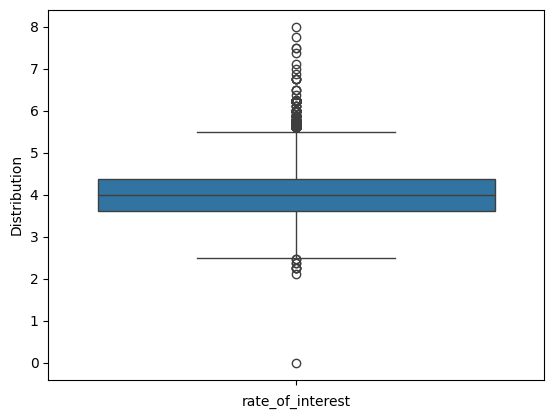

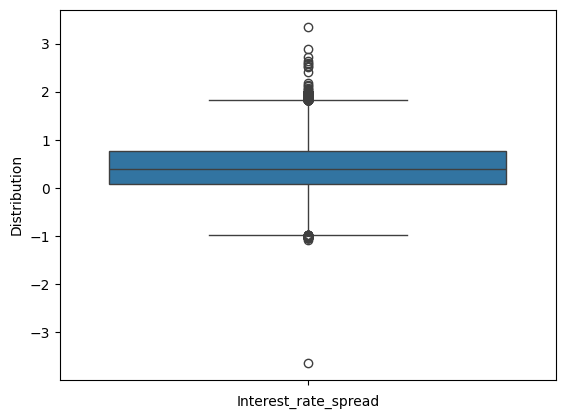

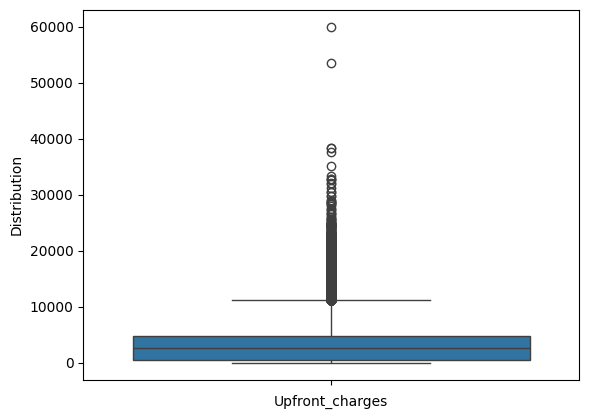

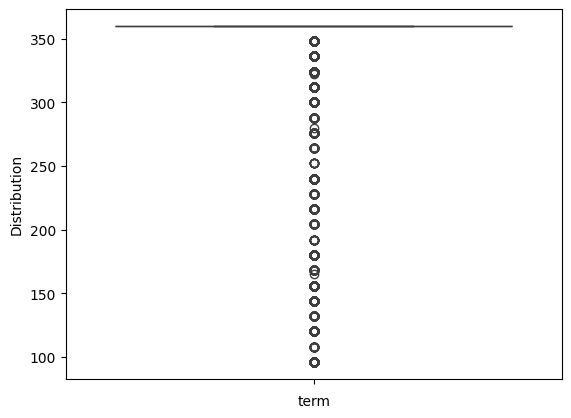

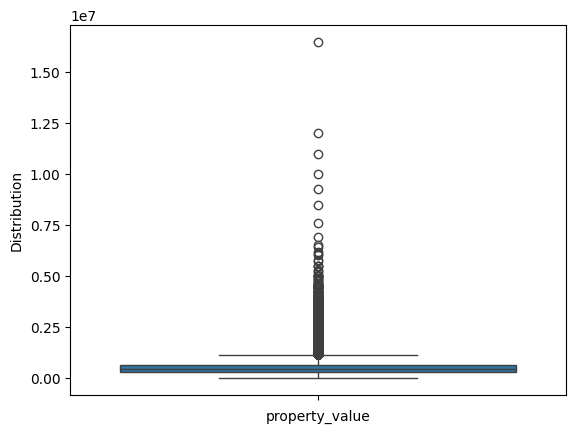

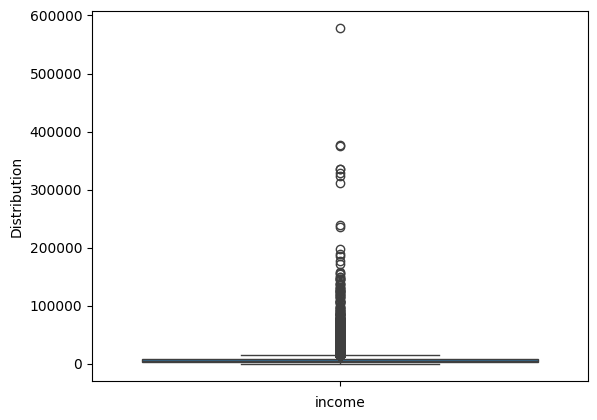

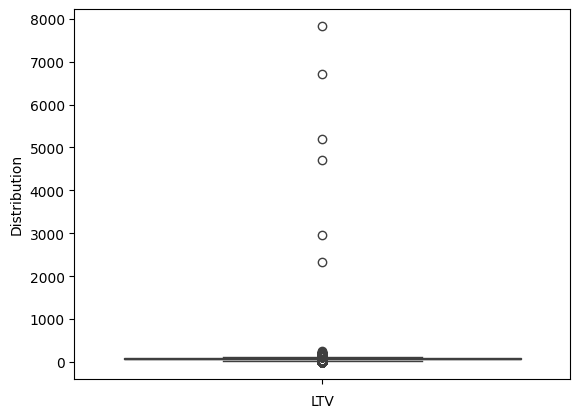

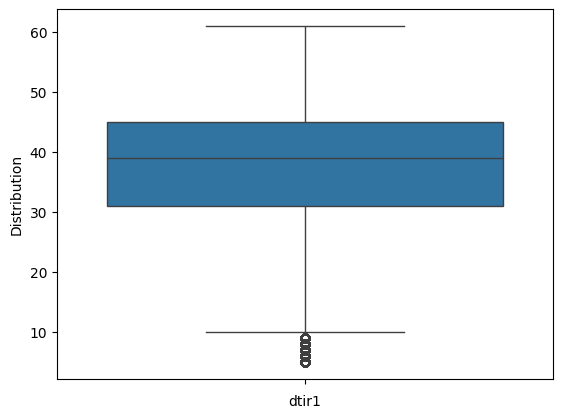

In [ ]:
#Visualizing outliers in numeric columns to impute missing values with either mean or median
#Using box plot
num_c=['rate_of_interest', 'Interest_rate_spread', 'Upfront_charges', 'term', 'property_value', 'income', 'LTV', 'dtir1']
for i in num_c:
  sns.boxplot(y=i, data=df)
  plt.xlabel(i)
  plt.ylabel('Distribution')
  plt.show()

As all numeric columns contain outliers, so using median imputation.


In [ ]:
# Imputation using Median
numeric_columns = num_c
imputer_mean = SimpleImputer(strategy='median')
df[numeric_columns] = imputer_mean.fit_transform(df[numeric_columns])

# Display the imputed DataFrames
print("\nImputed DataFrame using Median:")
print(df)


Imputed DataFrame using Median:
            ID  year loan_limit             Gender approv_in_adv loan_type  \
0        24890  2019         cf  Sex Not Available         nopre     type1   
1        24891  2019         cf               Male         nopre     type2   
2        24892  2019         cf               Male           pre     type1   
3        24893  2019         cf               Male         nopre     type1   
4        24894  2019         cf              Joint           pre     type1   
...        ...   ...        ...                ...           ...       ...   
148665  173555  2019         cf  Sex Not Available         nopre     type1   
148666  173556  2019         cf               Male         nopre     type1   
148667  173557  2019         cf               Male         nopre     type1   
148668  173558  2019         cf             Female         nopre     type1   
148669  173559  2019         cf             Female         nopre     type1   

       loan_purpose Credit_Wor

In [ ]:
#Now missing values check
df.isnull().sum()

ID                           0
year                         0
loan_limit                   0
Gender                       0
approv_in_adv                0
loan_type                    0
loan_purpose                 0
Credit_Worthiness            0
open_credit                  0
business_or_commercial       0
loan_amount                  0
rate_of_interest             0
Interest_rate_spread         0
Upfront_charges              0
term                         0
Neg_ammortization            0
interest_only                0
lump_sum_payment             0
property_value               0
construction_type            0
occupancy_type               0
Secured_by                   0
total_units                  0
income                       0
credit_type                  0
Credit_Score                 0
co-applicant_credit_type     0
age                          0
submission_of_application    0
LTV                          0
Region                       0
Security_Type                0
Status  

**So, all missing values has been infilled or removed.Now no missing value is present**

**Handling Outliers**


**Visualizing data distribution and outliers**

In [ ]:
con_col=df.select_dtypes(include=['int','float'])

**Using IQR to know the outliers**

In [ ]:
# IQR Outlier Removal
q1 = con_col.quantile(0.25)
q3 = con_col.quantile(0.75)
iqr = q3 - q1
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
outliers_iqr = con_col[((con_col < lower_bound) | (con_col > upper_bound)).any(axis=1)]

print("\nOutliers detected using IQR Outlier Removal:")
print(outliers_iqr)


Outliers detected using IQR Outlier Removal:
            ID  year  loan_amount  rate_of_interest  Interest_rate_spread  \
0        24890  2019       116500             3.990                0.3901   
1        24891  2019       206500             3.990                0.3901   
10       24900  2019       136500             3.990                0.3901   
12       24902  2019       206500             3.990                0.3901   
15       24905  2019        76500             3.990                0.3901   
...        ...   ...          ...               ...                   ...   
148665  173555  2019       436500             3.125                0.2571   
148666  173556  2019       586500             5.190                0.8544   
148667  173557  2019       446500             3.125                0.0816   
148668  173558  2019       196500             3.500                0.5824   
148669  173559  2019       406500             4.375                1.3871   

        Upfront_charges   ter

Based on analysis of continuous features some outliers were identified. But they are probaly not an outlier given the problem statement.

# **Exploratory Data Analysis (EDA) - Uncover Insights, Ignite Understanding.**

**Distribution Analysis: Univariate analysis(Continuous features)**

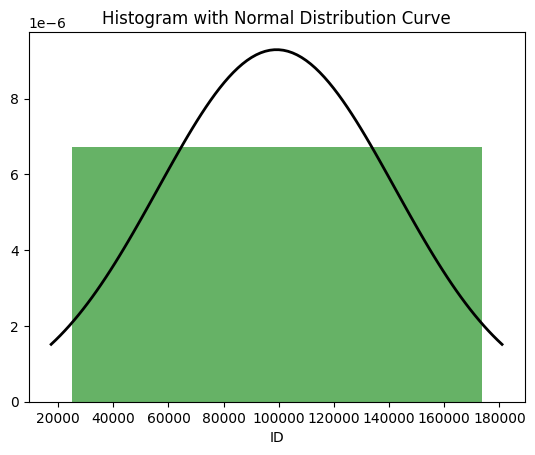

/usr/local/lib/python3.10/dist-packages/scipy/stats/_distn_infrastructure.py:1983: RuntimeWarning: divide by zero encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


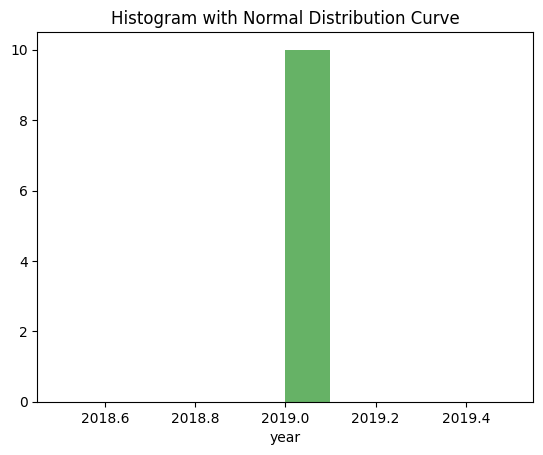

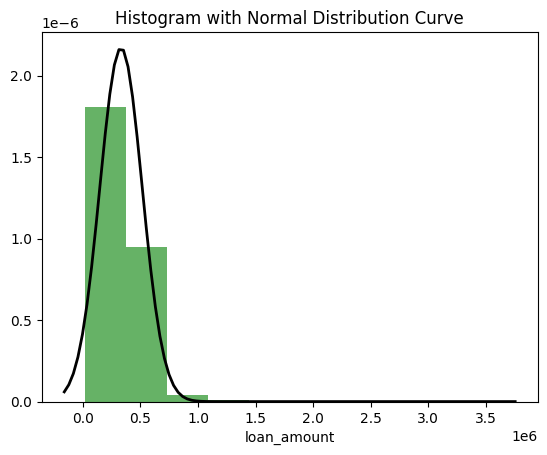

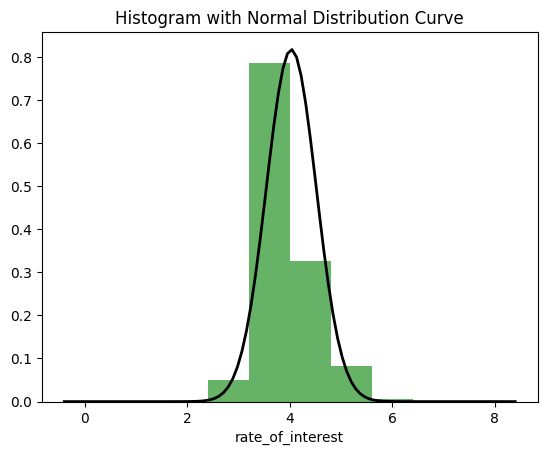

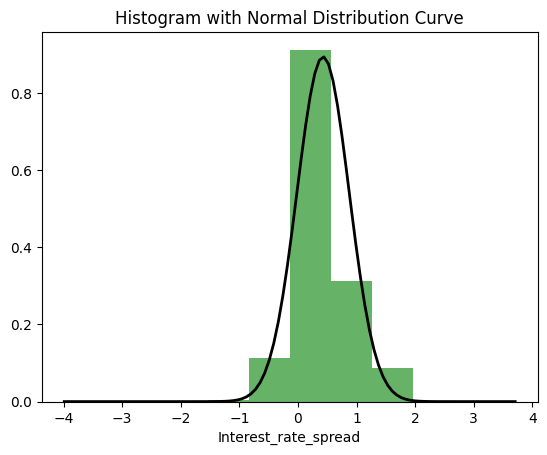

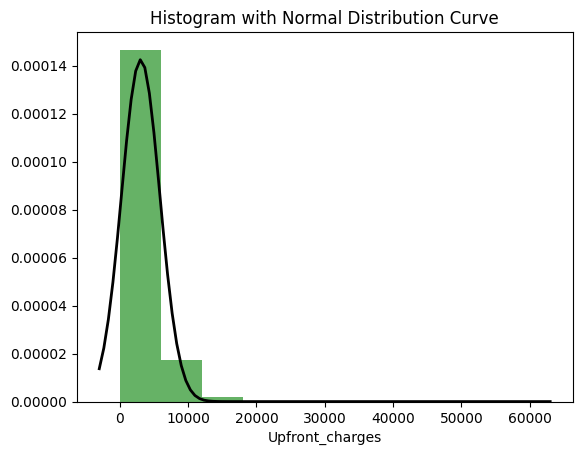

...

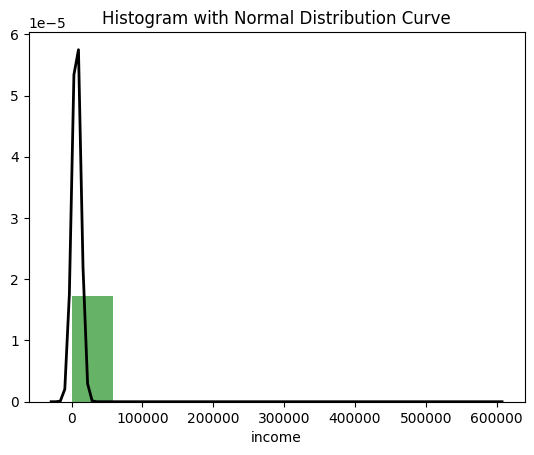

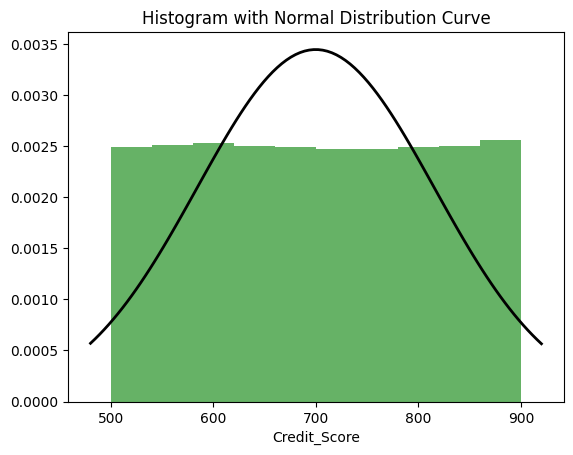

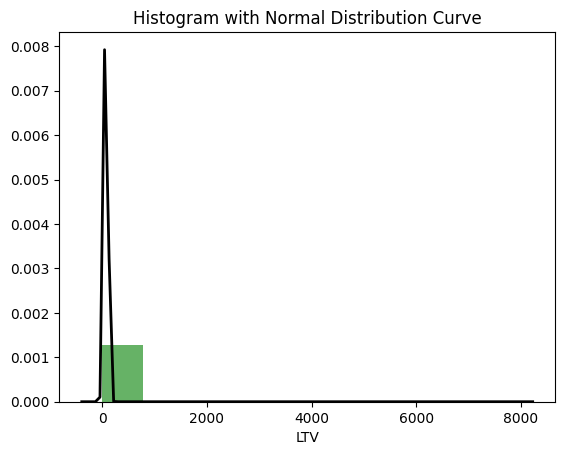

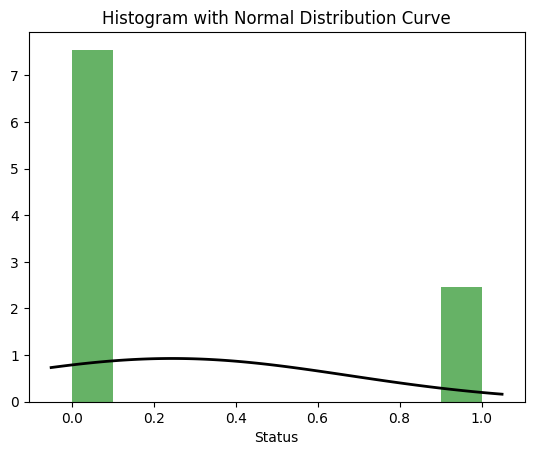

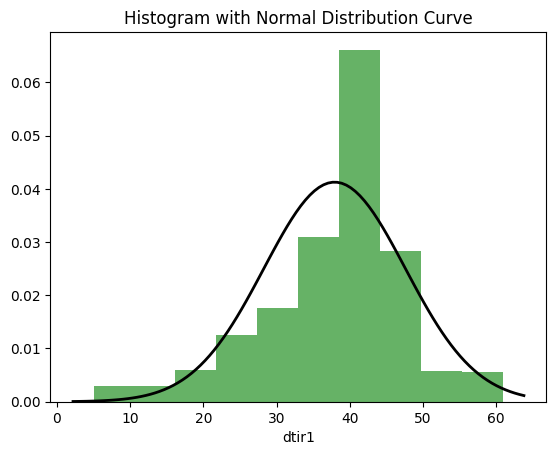

In [ ]:
# Histogram
from scipy.stats import norm
for i in con_col.columns:
  # calculate mean and standard deviation
  mu, std = norm.fit(df[i])
  # plot histogram with normal distribution curve
  plt.hist(df[i], bins=10, density=True, alpha=0.6, color='g')
  xmin, xmax = plt.xlim()
  x = np.linspace(xmin, xmax, 100)
  p = norm.pdf(x, mu, std)
  plt.plot(x, p, 'k', linewidth=2)
  plt.xlabel(i)
  plt.title("Histogram with Normal Distribution Curve")
  plt.show()




Based on the feature distribution, following conclusions are obtained:-

1. **ID**(uniform distribution and gaps) ,
2. **year**(constant),
3. **loan_amount**(right skewed and some gaps),
4. **rate_of_interest**(almost normally distribued),
5. **interest_rate_spread**(near normal distribution, left skew),
6. **upfront_charges**(right skew),
7. **term**(concentrated data around mode, outliers, platykurtic, left skew),
8. **property_value**(gaps in data, leptokurtic, right skew),
9. **income**(right skew, leptokurtic, gaps in data),
10. **credit_score**(near uniform distribution),
11. **LTV**(leptokurtic, gaps , right skew),
12. **dtir1**(Concentrated around mode, left skew)

**Distribution Analysis: Univariate analysis of Categorical variables**

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


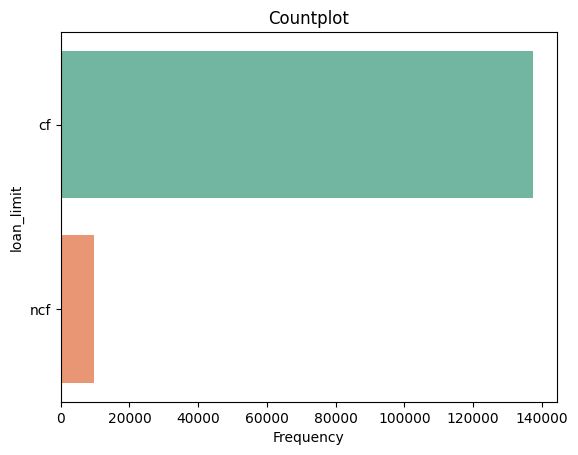

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


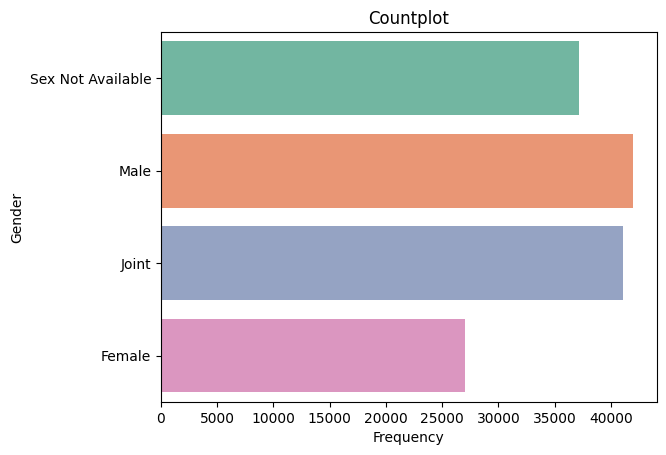

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


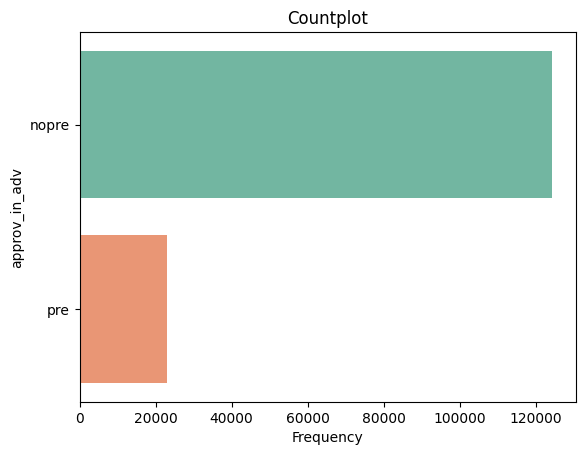

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


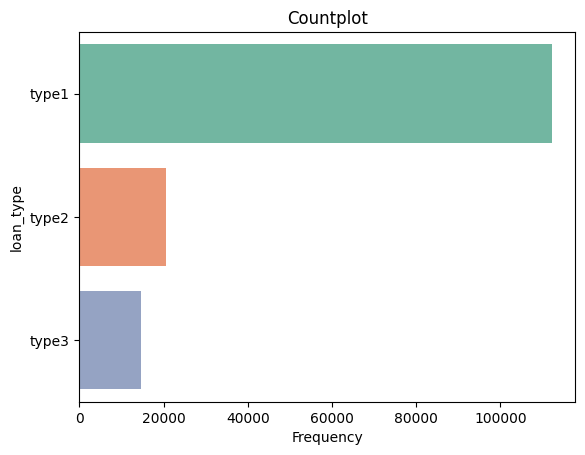

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


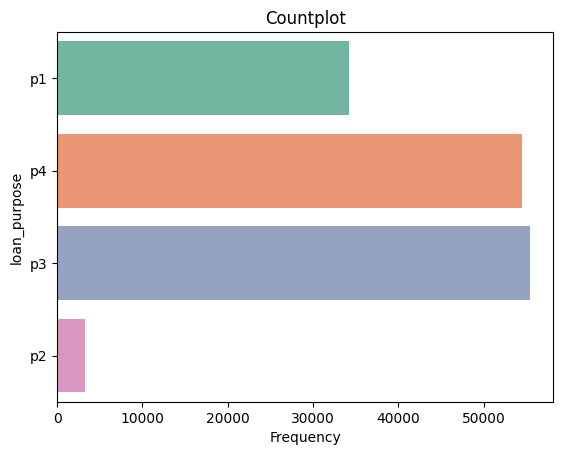

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


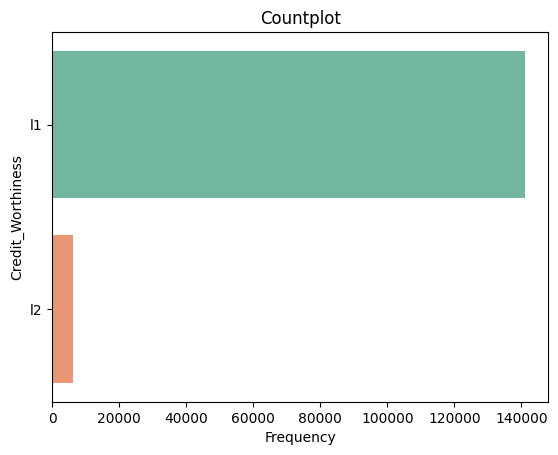

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


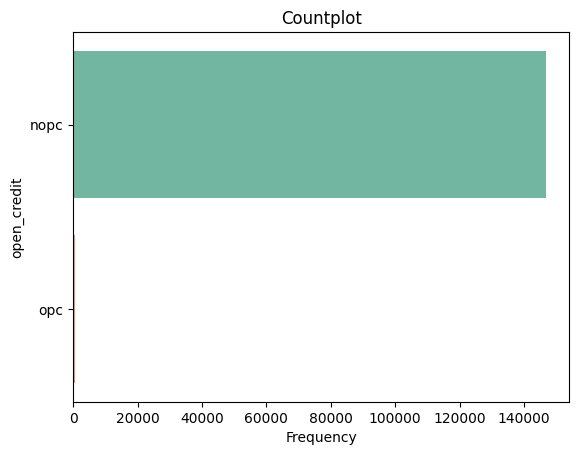

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


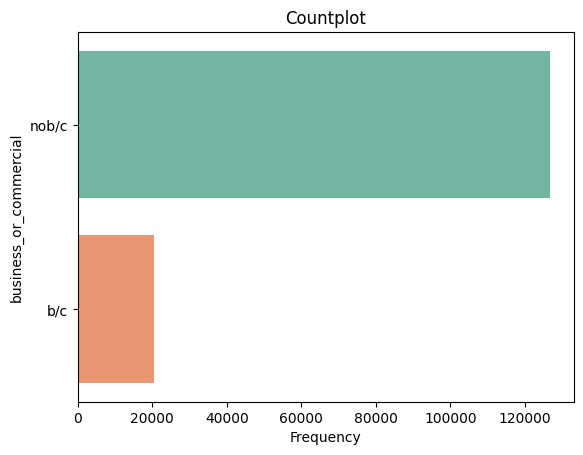

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


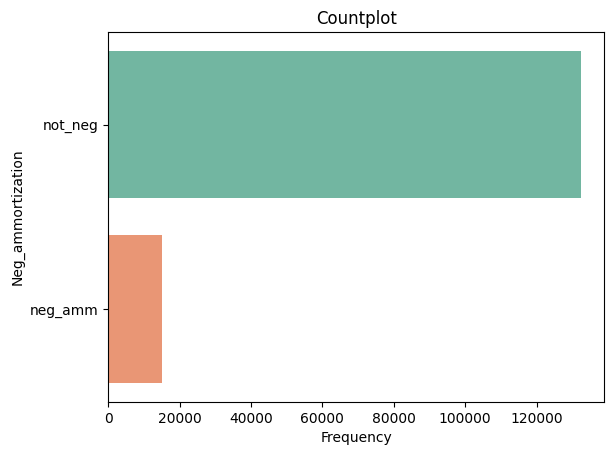

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


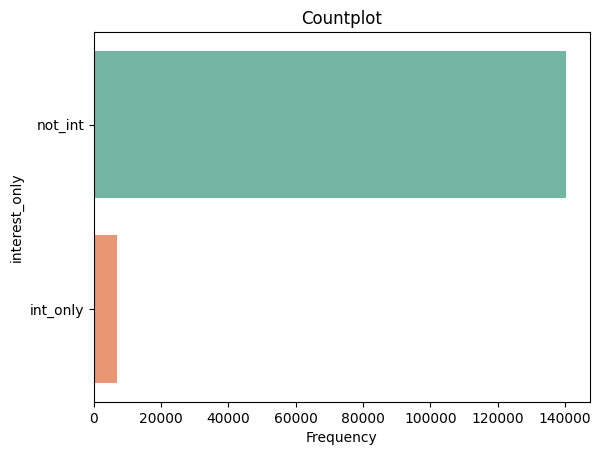

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


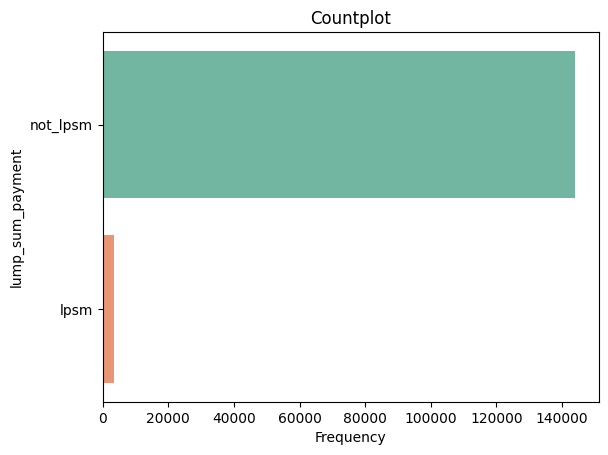

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


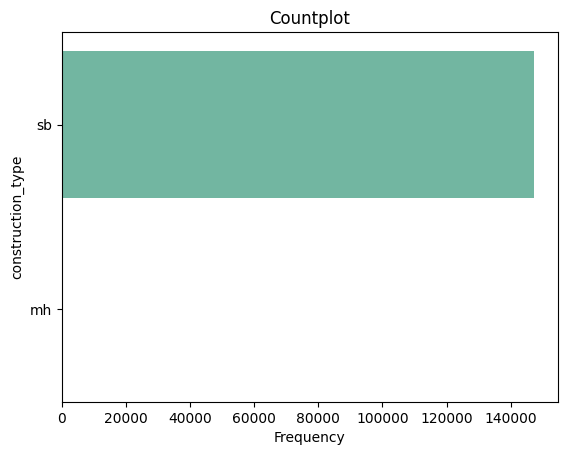

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


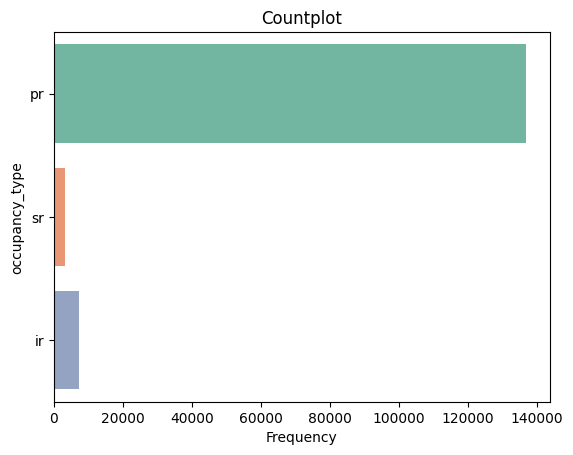

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


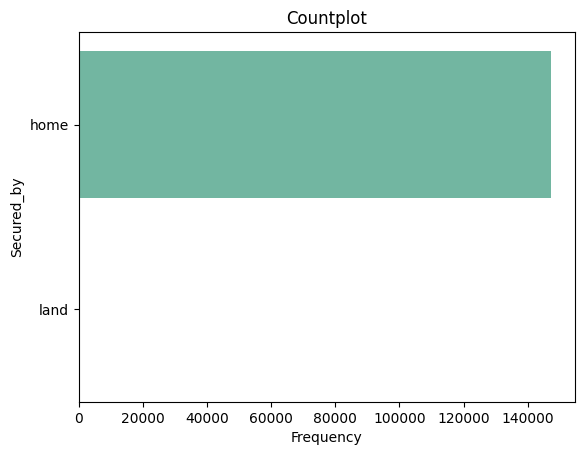

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


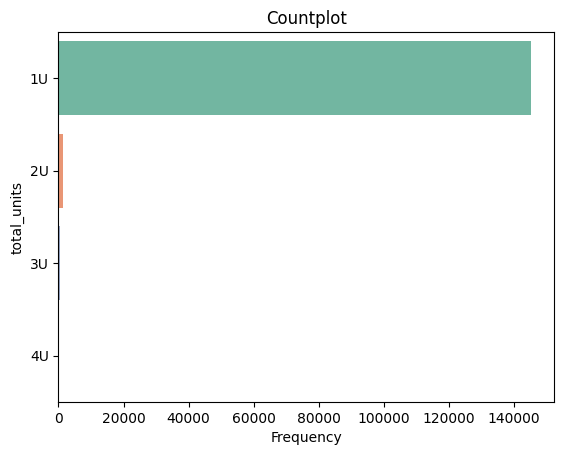

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


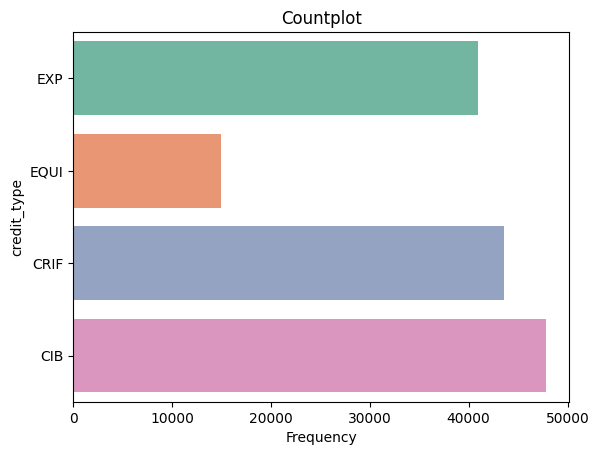

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


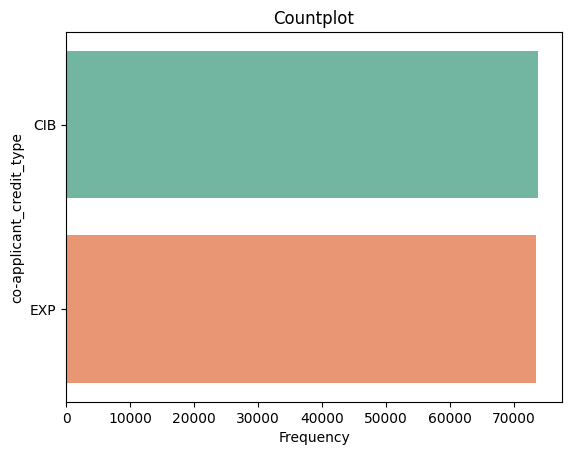

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


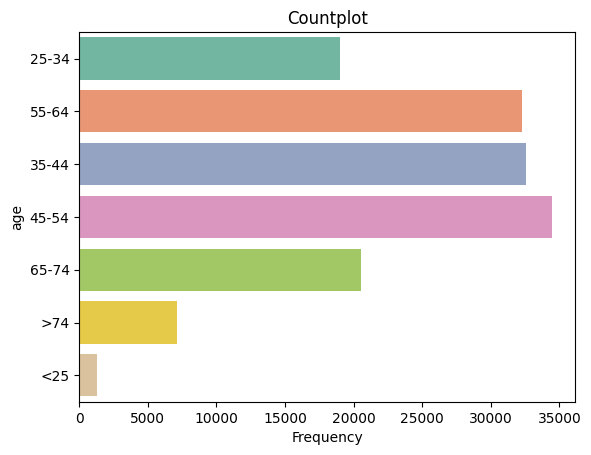

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


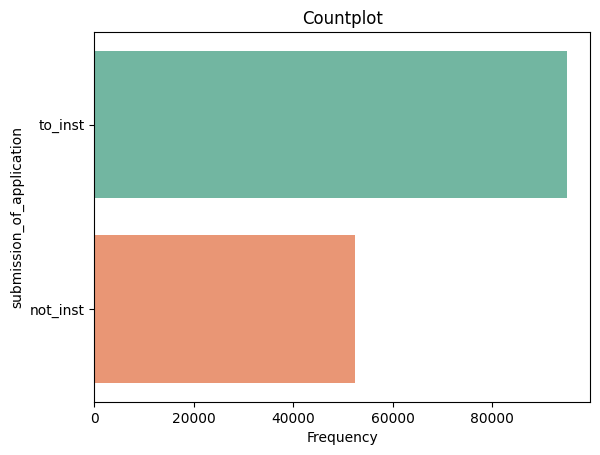

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


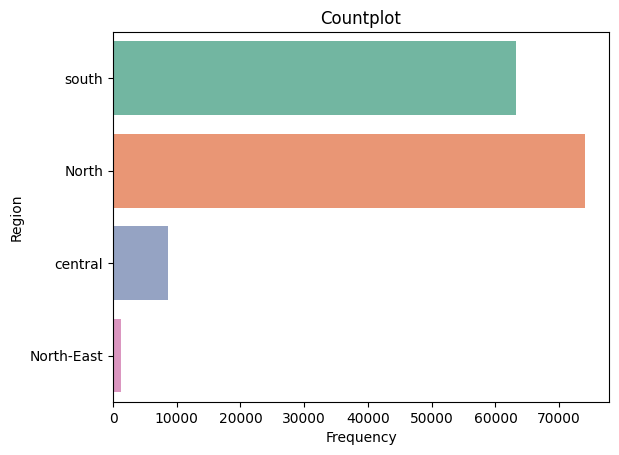

<ipython-input-25-ccb7b9389af9>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=i, data=df, palette = "Set2")


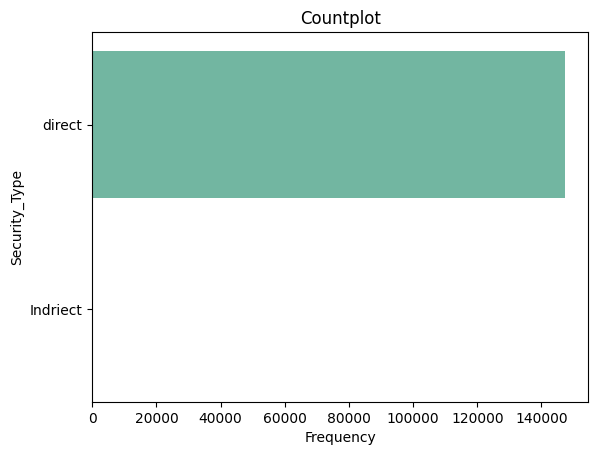

In [ ]:
catcol=df.select_dtypes(['object'])
for i in catcol.columns:
  sns.countplot(y=i, data=df, palette = "Set2")
  plt.ylabel(i)
  plt.xlabel('Frequency')
  plt.title('Countplot')
  plt.show()





**Interpretations**:-

1. Most loans conform to conforming loan_limits i.e limit decided by sovreign.
2. Most loans are offered to Male followed by Joint account holders.
3. Most loans are not preapproved.
4. Most loans are of Type1.
5. Most loans are for purpose p3, followed by p2.
6. Most people who borrowed had l1 credit worthiness.
7. Very few loans were made with Open credit provision.- Open-end credit is a type of loan that the borrower can draw money from repeatedly up to a certain pre-approved limit.Unlike closed-end credit, it has no fixed end date for repayment.When the borrower repays some of the money they have borrowed, it restores that portion of their pre-approved limit.
8. Most loans are not made for business/commercial purpose.
9. Most loans made come with negative ammortization i.e  increase in the principal balance of a loan caused by a failure to cover the interest due on that loan.
10. Most loans are not interest only, i.e they also include principle repayment.
11. Most loans do not have lumpsum payments.
12. Most loans have sb construction type.
13. Most loans have pr(primary) occupancy type.
14. Most loans are secured by home.
15. Most loans have a single unit.
16. Credit information companies which provided information about loans are as follows:- CIB>CRIF>EXP>EQUI.
17. Credit information companies which provided information about loans co-applicant are as follows:- CIB>EXP.
18. Age group availing loans are highest-(45-54), lowest(<25).
19. Most laon applicantions are submitted through to_instant medium.
20. Region with most loans is North.
21. Most loans have Direct security type.

**Bivariate Analysis: Examine relationships between the Numeric variables.**

**Examining Correlation** between:-
1. loan_amount and property_value
2. loan_amount and income
3. rate_of_interest and interest_rate spread
4. income and property_value
5. loan_amount vs interest_rate_spread
6. property_value vs interest_rate_spread
7. property_value vs LTV
8. income vs dtir1

for both :- loan_repayed(Status-0) and default(Status-1)

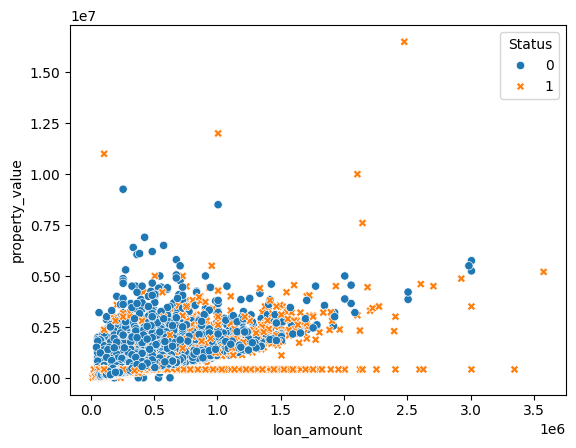

In [ ]:
sns.scatterplot(x='loan_amount',y='property_value',data=df,hue='Status',style='Status')
plt.show()

**More loans default as loan_amount increase but mortgaged property value is less.**

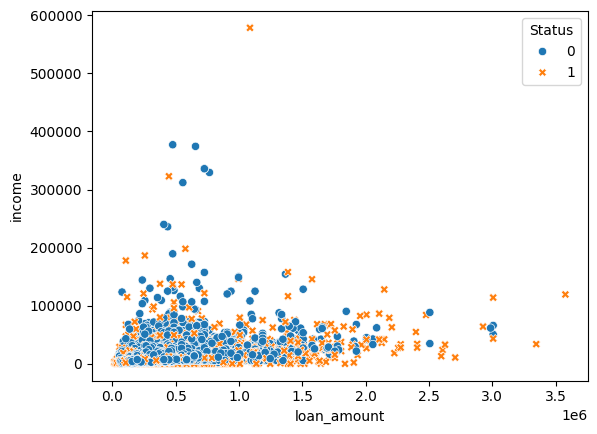

In [ ]:
sns.scatterplot(x='loan_amount',y='income',data=df,hue='Status',style='Status')
plt.show()

**Defaults increase if loan_amount is more but income recorded is low.**

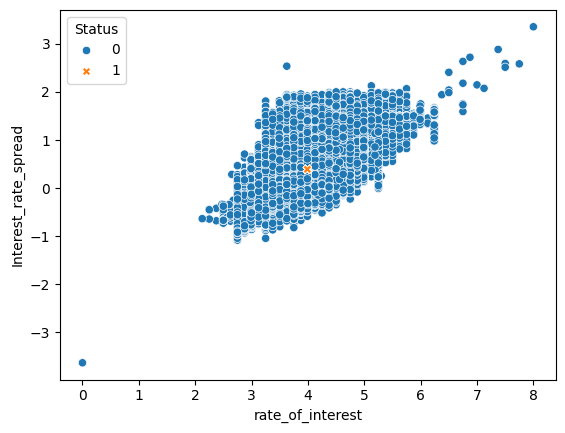

In [ ]:
sns.scatterplot(y='Interest_rate_spread',x='rate_of_interest',data=df,hue='Status',style='Status')
plt.show()

**Interest_rate and spread are highly correlated, however defaults appear to occur at a constant rate of 4.**

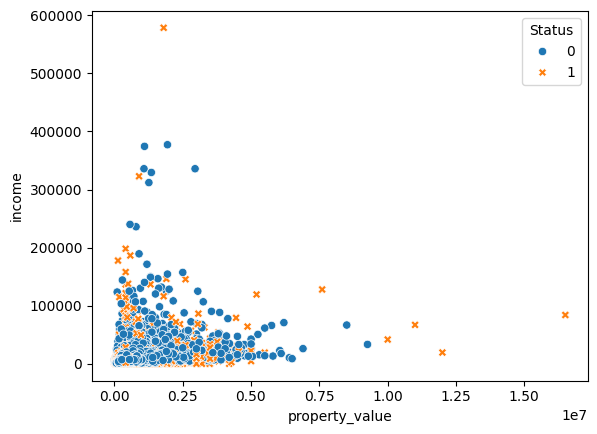

In [ ]:
sns.scatterplot(y='income',x='property_value',data=df,hue='Status',style='Status')
plt.show()

**Mortgaged property and income are correlated, most defaults occur at lower side of propeerty value and income**

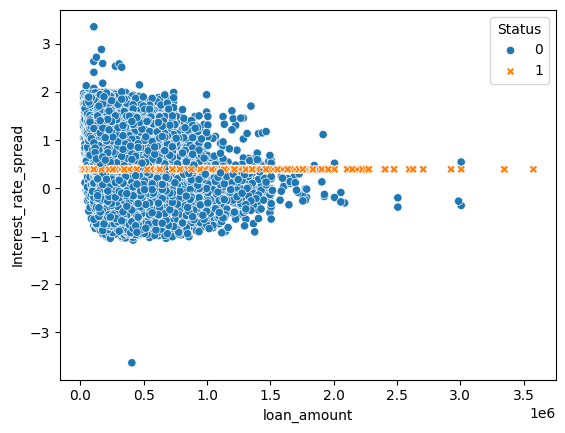

In [ ]:
sns.scatterplot(x='loan_amount',y='Interest_rate_spread',data=df,hue='Status',style='Status')
plt.show()

**irrespective of loan amount, defaults happen at spreads (0.3-0.4)**

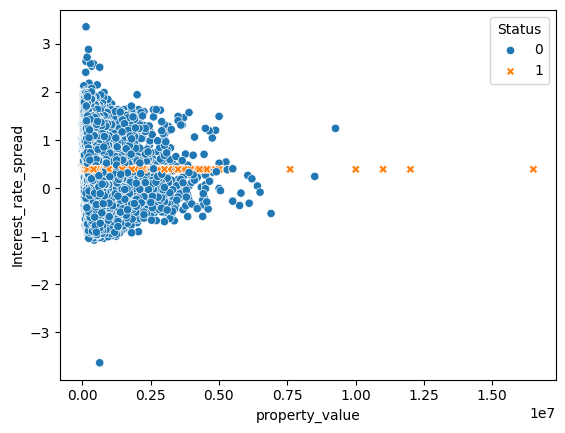

In [ ]:
sns.scatterplot(y='Interest_rate_spread',x='property_value',data=df,hue='Status',style='Status')
plt.show()

**irrespective of property_value, defaults happen at spreads (0.3-0.4)**

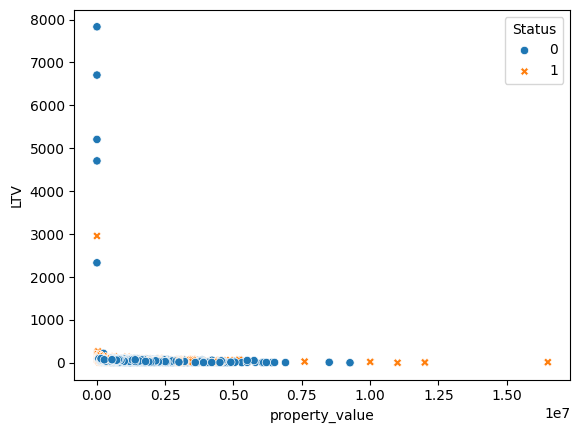

In [ ]:
sns.scatterplot(y='LTV',x='property_value',data=df,hue='Status',style='Status')
plt.show()

**More defaults happen at low LTV and high propery_value**

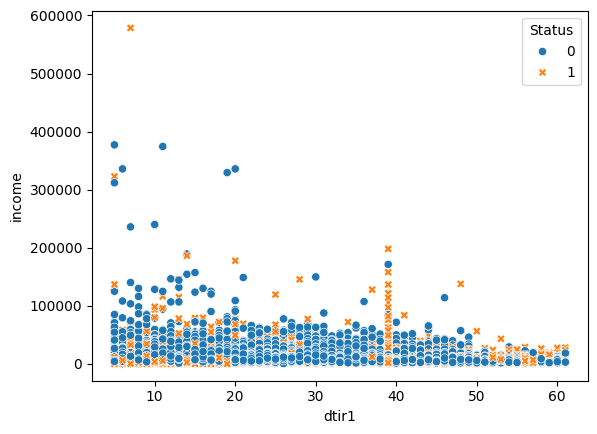

In [ ]:
sns.scatterplot(y='income',x='dtir1',data=df,hue='Status',style='Status')
plt.show()

**For dtir1=40, loans default irrespective of income.**

**Bivariate Analysis between Target variable-Status and categorical features**

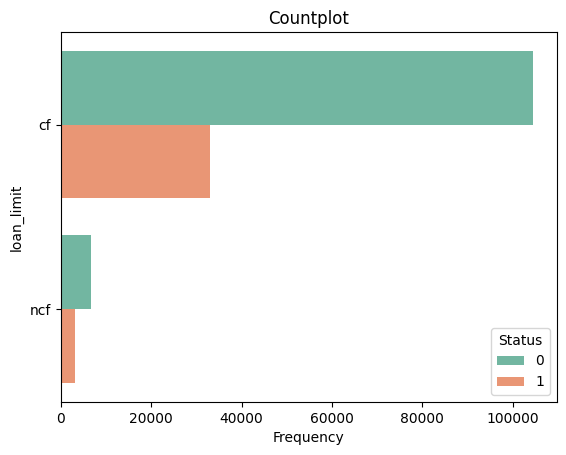

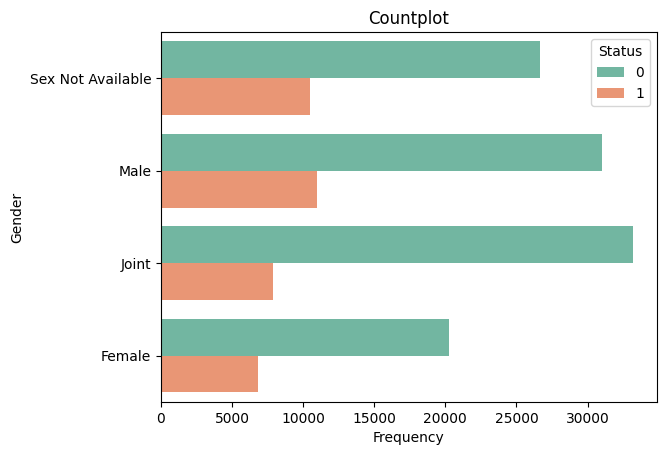

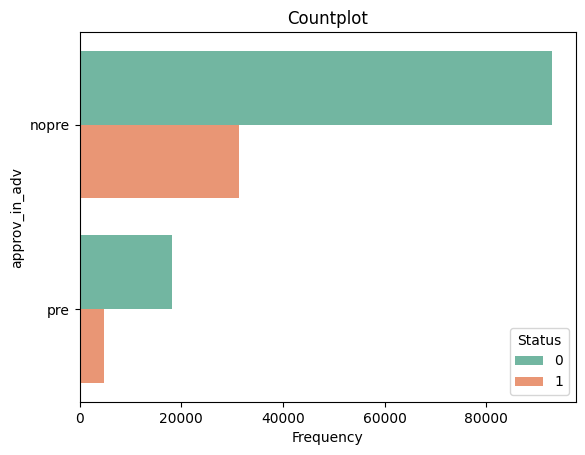

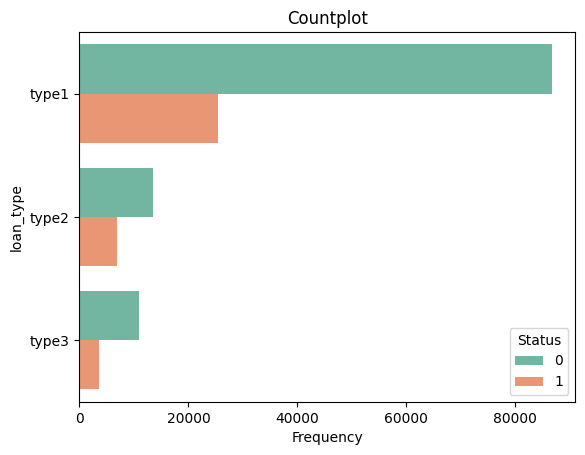

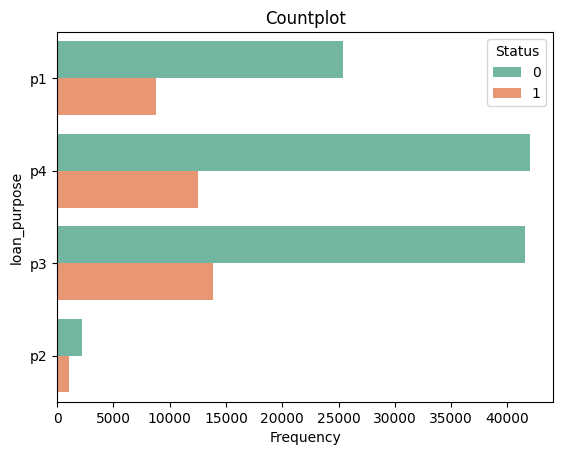

...

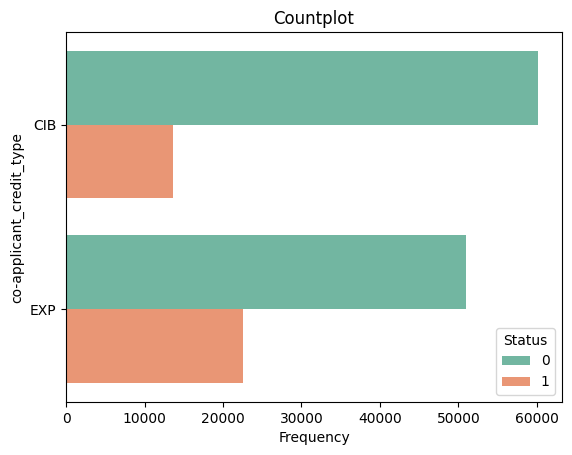

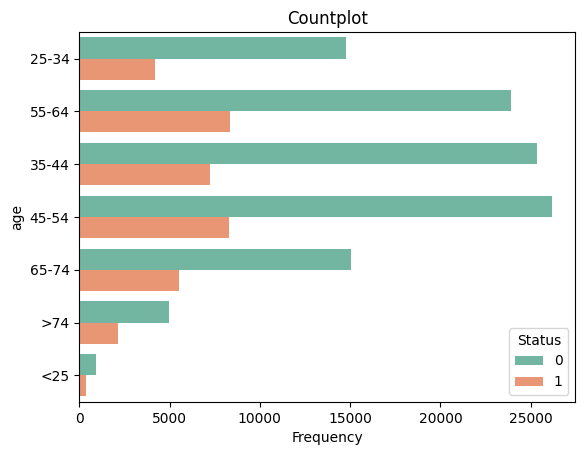

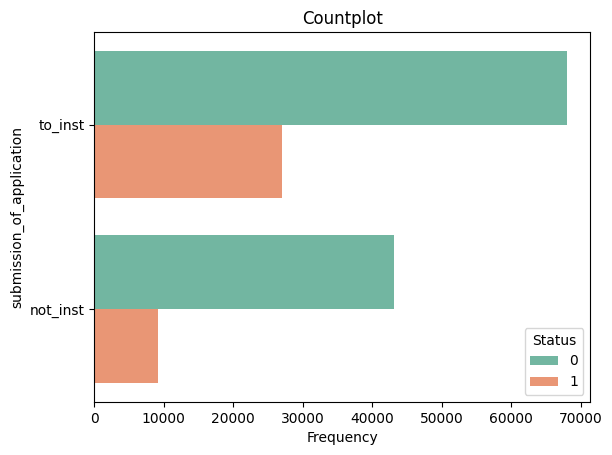

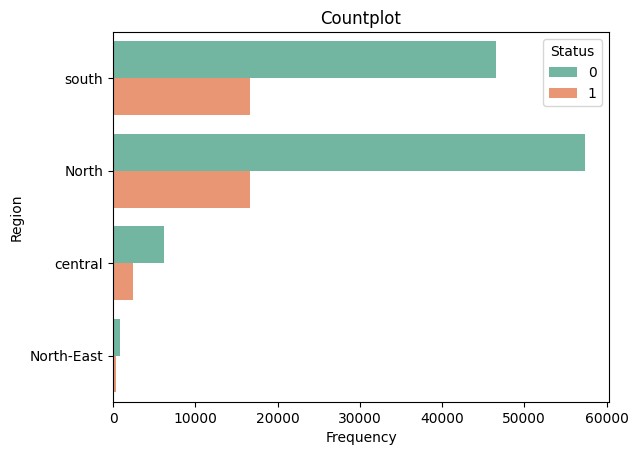

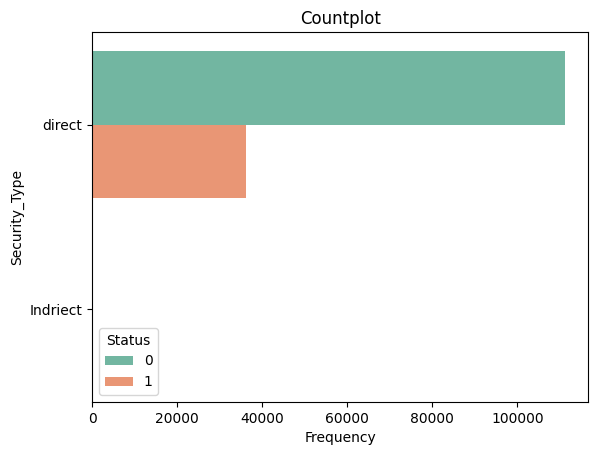

In [ ]:
for i in catcol.columns:
  ax=sns.countplot(y=i, data=df, palette = "Set2", hue='Status')
  plt.ylabel(i)
  plt.xlabel('Frequency')
  plt.title('Countplot')
  plt.show()


**Conclusions drawn are:-**
Indicators for defaults are:-
1. Both cf and ncf(more in % terms)
2. All Genders(more if sex not available)
3. Both approv_in_adv
4. All loan type
5. All loan purpose
6. Both credit worhiness
7. More in non open credit
8. In all busness/commercial or not.
9. More in negative ammortisation, but also if not
10. In both-int or not interest only.
11. More in lump sum payment(% wise),but also in other
12. More in sb construction type
13. In all occupancy type
14. More in loans secured by home
15. More if single unit
16. More if credit agency os EQUI, but also in others.
17. In all for co-applicant credit type.
18. In all age groups.
19. In all mode of application submission
20. In all regions
21. More in direct security type.


**Multivariate Analysis & Feature Relationships: Explore complex interrelationships using tools like heatmaps and pair plots.**

In [ ]:
#Taking sample of 1000 random rows from numeric features
import random
con_col_sample=random.sample(range(len(df)),1000)


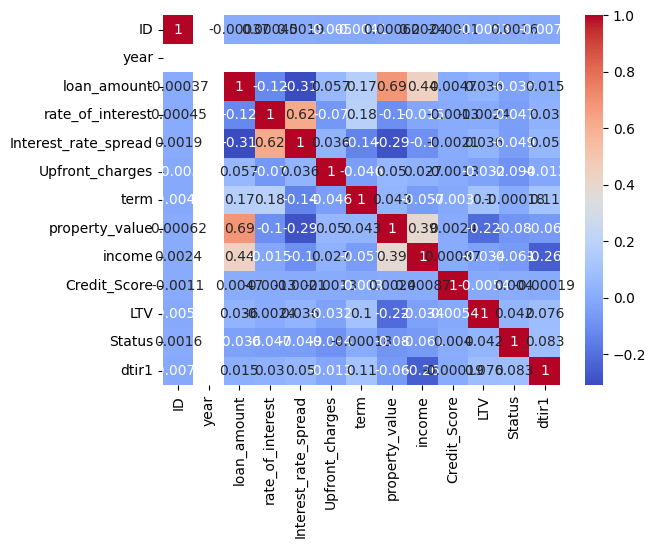

In [ ]:
#heatmap
sns.heatmap(con_col.corr(),annot=True,cmap='coolwarm')
plt.show()

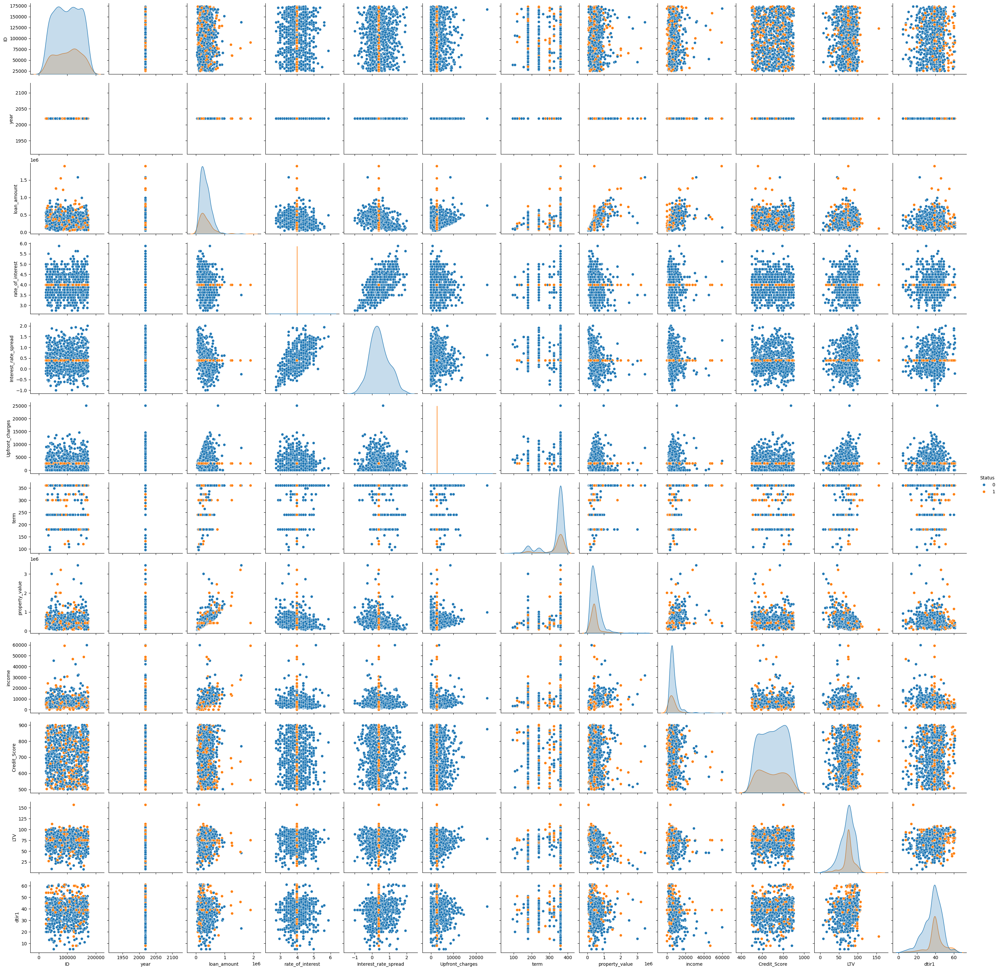

In [ ]:
#pairplots
sns.pairplot(data=con_col.iloc[con_col_sample],hue='Status')
plt.show()

Based on it, we can say:-
**1. Strong positive correlation**
	  1. loan_amount vs property_value
	  2. rate_of_interest vs interest_rate_spread

**2.Moderate positive correlation:**
	  1. income vs loan_amount
	  2. income vs property_value

**3.Moderate negative correlation**
	  1. loan_amount vs interest_rate_spread
	  2. property_value vs interest_rate_spread
	  3. property_value vs LTV


**EDA interpretations**

1. Loan defaults categorized by Region.
2. Loan defaults categorized by Age group.
3. Total loan amount defaulted as share of total loans offered.
4. Correlating interest rates and loan amounts for defaulted and non default loans.
5. Correlating credit_score and loan amounts for defaulted and non default loans.


([<matplotlib.patches.Wedge at 0x7c315bfa8430>,
 [Text(0.1304643471374351, 1.0922358051840286, 'south'),
  Text(-0.38512760073046787, -1.030376984969867, 'North'),
  Text(1.0597804543030502, -0.29472934817764745, 'central'),
  Text(1.0994213029123836, -0.03567630449523638, 'North-East')],
 [Text(0.07116237116587368, 0.5957649846458337, '46.22%'),
  Text(-0.210069600398437, -0.5620238099835637, '46.18%'),
  Text(0.5780620659834819, -0.16076146264235314, '6.57%'),
  Text(0.5996843470431182, -0.019459802451947113, '1.03%')])

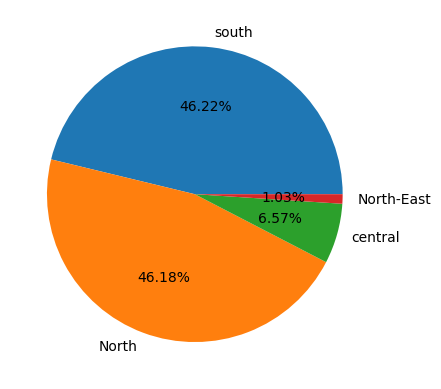

In [ ]:
#Loan defaults categorised by region
plt.pie(df[df['Status']==1]['Region'].value_counts(),labels=df[df['Status']==1]['Region'].unique(),autopct='%1.2f%%')

([<matplotlib.patches.Wedge at 0x7c315fa03100>,
 [Text(0.8230006116444015, 0.7298424441158112, '25-34'),
  Text(-0.6213297052415111, 0.907716584284157, '55-64'),
  Text(-1.021760785046181, -0.40743698671305234, '65-74'),
  Text(-0.08963288851045845, -1.0963420749461694, '45-54'),
  Text(0.761897792234098, -0.7934177677546724, '35-44'),
  Text(1.0650339848848471, -0.2751410747967369, '<25'),
  Text(1.0993866751865202, -0.03672789705834881, '>74')],
 [Text(0.4489094245333099, 0.3980958786086243, '23.09%'),
  Text(-0.3389071119499151, 0.49511813688226736, '22.92%'),
  Text(-0.5573240645706441, -0.2222383563889376, '20.05%'),
  Text(-0.04889066646025005, -0.598004768152456, '15.28%'),
  Text(0.4155806139458716, -0.4327733278661849, '11.68%'),
  Text(0.5809276281190074, -0.15007694988912917, '5.92%'),
  Text(0.5996654591926474, -0.020033398395462986, '1.06%')])

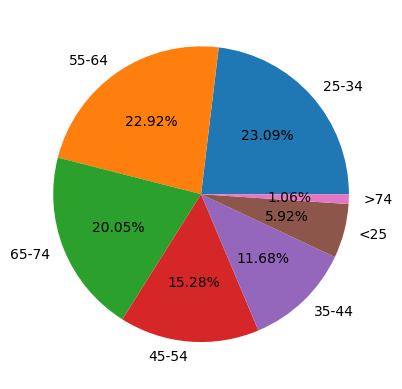

In [ ]:
#Loan defaults categorized by age group
plt.pie(df[df['Status']==1]['age'].value_counts(),labels=df[df['Status']==1]['age'].unique(),autopct='%1.2f%%')

([<matplotlib.patches.Wedge at 0x7c315c5a20e0>,
 [Text(-0.8093779297377296, 0.7449210473959419, 'Not Default'),
  Text(0.8093778251209085, -0.7449211610650809, 'Default')],
 [Text(-0.44147887076603426, 0.4063205713068773, '76.32%'),
  Text(0.44147881370231373, -0.4063206333082259, '23.68%')])

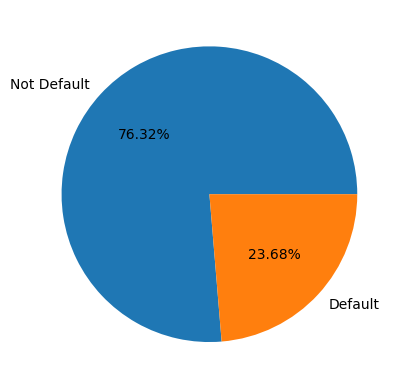

In [ ]:
#Total loan amount defaulted as share of total loan offered
plt.pie(df.groupby('Status')['loan_amount'].sum(),labels=['Not Default','Default'],autopct='%1.2f%%')

<Axes: xlabel='rate_of_interest', ylabel='loan_amount'>

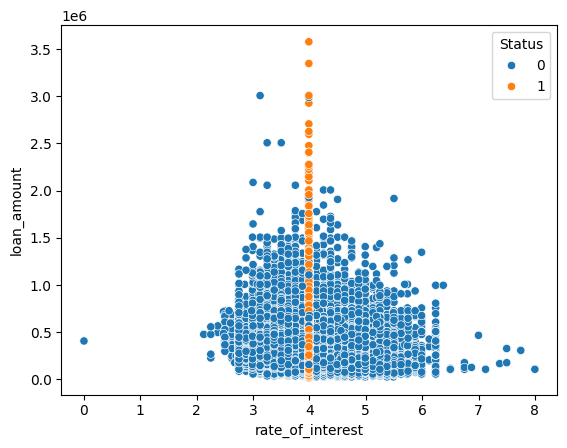

In [ ]:
#Correlating interest rates and loan amounts for defaulted and non default loans
sns.scatterplot(x=df['rate_of_interest'],y=df['loan_amount'],hue=df['Status'])

<Axes: xlabel='Credit_Score', ylabel='loan_amount'>

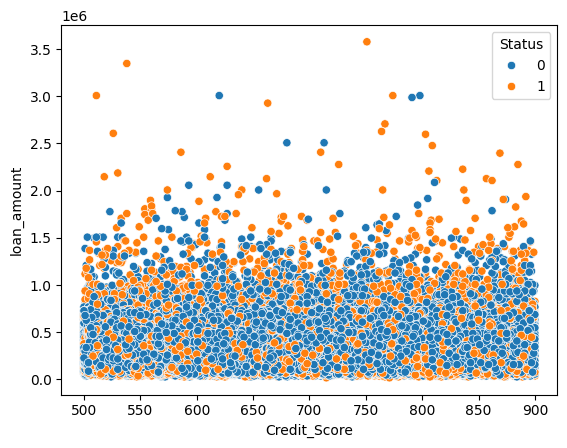

In [ ]:
#Correlating credit_score and loan amounts for defaulted and non default loans
sns.scatterplot(x=df['Credit_Score'],y=df['loan_amount'],hue=df['Status'])

# **Categorical Encoding**

The following categorical featurs need to be encoded:-


In [ ]:
catcol=df.select_dtypes(['object'])
catcol.head()

,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,Neg_ammortization,interest_only,lump_sum_payment,construction_type,occupancy_type,Secured_by,total_units,credit_type,co-applicant_credit_type,age,submission_of_application,Region,Security_Type
0,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,not_neg,not_int,not_lpsm,sb,pr,home,1U,EXP,CIB,25-34,to_inst,south,direct
1,cf,Male,nopre,type2,p1,l1,nopc,b/c,not_neg,not_int,lpsm,sb,pr,home,1U,EQUI,EXP,55-64,to_inst,North,direct
2,cf,Male,pre,type1,p1,l1,nopc,nob/c,neg_amm,not_int,not_lpsm,sb,pr,home,1U,EXP,CIB,35-44,to_inst,south,direct
3,cf,Male,nopre,type1,p4,l1,nopc,nob/c,not_neg,not_int,not_lpsm,sb,pr,home,1U,EXP,CIB,45-54,not_inst,North,direct
4,cf,Joint,pre,type1,p1,l1,nopc,nob/c,not_neg,not_int,not_lpsm,sb,pr,home,1U,CRIF,EXP,25-34,not_inst,North,direct


In [ ]:
catcol.columns

Index(['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose',
       'Credit_Worthiness', 'open_credit', 'business_or_commercial',
       'Neg_ammortization', 'interest_only', 'lump_sum_payment',
       'construction_type', 'occupancy_type', 'Secured_by', 'total_units',
       'credit_type', 'co-applicant_credit_type', 'age',
       'submission_of_application', 'Region', 'Security_Type'],
      dtype='object')

In [ ]:
for i in catcol.columns:
  print(f'Unique categories in {i} feature are' ,df[i].nunique())

Unique categories in loan_limit feature are 2
Unique categories in Gender feature are 4
Unique categories in approv_in_adv feature are 2
Unique categories in loan_type feature are 3
Unique categories in loan_purpose feature are 4
Unique categories in Credit_Worthiness feature are 2
Unique categories in open_credit feature are 2
Unique categories in business_or_commercial feature are 2
Unique categories in Neg_ammortization feature are 2
Unique categories in interest_only feature are 2
Unique categories in lump_sum_payment feature are 2
Unique categories in construction_type feature are 2
Unique categories in occupancy_type feature are 3
Unique categories in Secured_by feature are 2
Unique categories in total_units feature are 4
Unique categories in credit_type feature are 4
Unique categories in co-applicant_credit_type feature are 2
Unique categories in age feature are 7
Unique categories in submission_of_application feature are 2
Unique categories in Region feature are 4
Unique catego

Based on nature of data, no. of categories in each feature and required analysis, we will apply **'One hot encoding'** for categorical features.


In [ ]:
#Installing library and importing package for encoding categorical features
!pip install category_encoders
import category_encoders as ce


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 1.9 MB/s eta 0:00:00


In [ ]:
# Apply one-hot encoding
one_hot_encoder = ce.OneHotEncoder()
encoded_df = one_hot_encoder.fit_transform(df[catcol.columns])

In [ ]:
encoded_df.head()

,loan_limit_1,loan_limit_2,Gender_1,Gender_2,Gender_3,Gender_4,approv_in_adv_1,approv_in_adv_2,loan_type_1,loan_type_2,loan_type_3,loan_purpose_1,loan_purpose_2,loan_purpose_3,loan_purpose_4,Credit_Worthiness_1,Credit_Worthiness_2,open_credit_1,open_credit_2,business_or_commercial_1,business_or_commercial_2,Neg_ammortization_1,Neg_ammortization_2,interest_only_1,interest_only_2,lump_sum_payment_1,lump_sum_payment_2,construction_type_1,construction_type_2,occupancy_type_1,occupancy_type_2,occupancy_type_3,Secured_by_1,Secured_by_2,total_units_1,total_units_2,total_units_3,total_units_4,credit_type_1,credit_type_2,credit_type_3,credit_type_4,co-applicant_credit_type_1,co-applicant_credit_type_2,age_1,age_2,age_3,age_4,age_5,age_6,age_7,submission_of_application_1,submission_of_application_2,Region_1,Region_2,Region_3,Region_4,Security_Type_1,Security_Type_2
0,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0
1,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
2,1,0,0,1,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0
3,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0
4,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0


In [ ]:
merged_df = pd.concat([df, encoded_df], axis=1)

In [ ]:
merged_df.columns

Index(['ID', 'year', 'loan_limit', 'Gender', 'approv_in_adv', 'loan_type',
       'loan_purpose', 'Credit_Worthiness', 'open_credit',
       'business_or_commercial', 'loan_amount', 'rate_of_interest',
       'Interest_rate_spread', 'Upfront_charges', 'term', 'Neg_ammortization',
       'interest_only', 'lump_sum_payment', 'property_value',
       'construction_type', 'occupancy_type', 'Secured_by', 'total_units',
       'income', 'credit_type', 'Credit_Score', 'co-applicant_credit_type',
       'age', 'submission_of_application', 'LTV', 'Region', 'Security_Type',
       'Status', 'dtir1', 'loan_limit_1', 'loan_limit_2', 'Gender_1',
       'Gender_2', 'Gender_3', 'Gender_4', 'approv_in_adv_1',
       'approv_in_adv_2', 'loan_type_1', 'loan_type_2', 'loan_type_3',
       'loan_purpose_1', 'loan_purpose_2', 'loan_purpose_3', 'loan_purpose_4',
       'Credit_Worthiness_1', 'Credit_Worthiness_2', 'open_credit_1',
       'open_credit_2', 'business_or_commercial_1', 'business_or_commercial_2

# **Data Normalization(Log_Transformation)**

In [ ]:
#Numeric features are as follows:-
con_col.head()

,ID,year,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,property_value,income,Credit_Score,LTV,Status,dtir1
0,24890,2019,116500,3.99,0.3901,2599.325,360.0,118000.0,1740.0,758,98.728814,1,45.0
1,24891,2019,206500,3.99,0.3901,2599.325,360.0,418000.0,4980.0,552,75.122549,1,39.0
2,24892,2019,406500,4.56,0.2000,595.000,360.0,508000.0,9480.0,834,80.019685,0,46.0
3,24893,2019,456500,4.25,0.6810,2599.325,360.0,658000.0,11880.0,587,69.376900,0,42.0
4,24894,2019,696500,4.00,0.3042,0.000,360.0,758000.0,10440.0,602,91.886544,0,39.0


In [ ]:
con_col.columns

Index(['ID', 'year', 'loan_amount', 'rate_of_interest', 'Interest_rate_spread',
       'Upfront_charges', 'term', 'property_value', 'income', 'Credit_Score',
       'LTV', 'Status', 'dtir1'],
      dtype='object')

**Min-Max scaling** - Suitable for features with a known minimum and maximum range.Used for following features-year, Status

**z-Score normalisation**- Appropriate when data follows an approximately normal distribution.. It is sensitive to outliers. Features applicable are- rate_of_interest, Interest_rate_spread.

**Log transformation** - Useful for data with a wide range of values, especially when there are extreme outliers. Features applicable are - ID, loan_amount, Upfront_charges,	term,	property_value,	income,	Credit_Score, LTV,	dtir1

In [ ]:
#Importing libraries and packages
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.preprocessing import FunctionTransformer

In [ ]:
# Log Transformation
transformer_log = FunctionTransformer(np.log1p)
merged_df[['ID','year','loan_amount', 'Upfront_charges',	'term',	'property_value',	'income',	'Credit_Score', 'LTV',	'dtir1']] = transformer_log.transform(merged_df[['ID','year','loan_amount', 'Upfront_charges',	'term',	'property_value',	'income',	'Credit_Score', 'LTV', 'dtir1']])


In [ ]:
merged_df

,ID,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,Neg_ammortization,interest_only,lump_sum_payment,property_value,construction_type,occupancy_type,Secured_by,total_units,income,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1,loan_limit_1,loan_limit_2,Gender_1,Gender_2,Gender_3,Gender_4,approv_in_adv_1,approv_in_adv_2,loan_type_1,loan_type_2,loan_type_3,loan_purpose_1,loan_purpose_2,loan_purpose_3,loan_purpose_4,Credit_Worthiness_1,Credit_Worthiness_2,open_credit_1,open_credit_2,business_or_commercial_1,business_or_commercial_2,Neg_ammortization_1,Neg_ammortization_2,interest_only_1,interest_only_2,lump_sum_payment_1,lump_sum_payment_2,construction_type_1,construction_type_2,occupancy_type_1,occupancy_type_2,occupancy_type_3,Secured_by_1,Secured_by_2,total_units_1,total_units_2,total_units_3,total_units_4,credit_type_1,credit_type_2,credit_type_3,credit_type_4,co-applicant_credit_type_1,co-applicant_credit_type_2,age_1,age_2,age_3,age_4,age_5,age_6,age_7,submission_of_application_1,submission_of_application_2,Region_1,Region_2,Region_3,Region_4,Security_Type_1,Security_Type_2
0,10.122262,7.610853,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,11.665655,3.990,0.3901,7.863392,5.888878,not_neg,not_int,not_lpsm,11.678448,sb,pr,home,1U,7.462215,EXP,6.632002,CIB,25-34,to_inst,4.602455,south,direct,1,3.828641,1,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0
1,10.122302,7.610853,cf,Male,nopre,type2,p1,l1,nopc,b/c,12.238061,3.990,0.3901,7.863392,5.888878,not_neg,not_int,lpsm,12.943239,sb,pr,home,1U,8.513386,EQUI,6.315358,EXP,55-64,to_inst,4.332345,North,direct,1,3.688879,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,1,1,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0
2,10.122342,7.610853,cf,Male,pre,type1,p1,l1,nopc,nob/c,12.915342,4.560,0.2000,6.390241,5.888878,neg_amm,not_int,not_lpsm,13.138239,sb,pr,home,1U,9.157045,EXP,6.727432,CIB,35-44,to_inst,4.394692,south,direct,0,3.850148,1,0,0,1,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0
3,10.122382,7.610853,cf,Male,nopre,type1,p4,l1,nopc,nob/c,13.031346,4.250,0.6810,7.863392,5.888878,not_neg,not_int,not_lpsm,13.396962,sb,pr,home,1U,9.382696,EXP,6.376727,CIB,45-54,not_inst,4.253865,North,direct,0,3.761200,1,0,0,1,0,0,1,0,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0
4,10.122422,7.610853,cf,Joint,pre,type1,p1,l1,nopc,nob/c,13.453825,4.000,0.3042,0.000000,5.888878,not_neg,not_int,not_lpsm,13.538440,sb,pr,home,1U,9.253496,CRIF,6.401917,EXP,25-34,not_inst,4.531379,North,direct,0,3.688879,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148665,12.064256,7.610853,cf,Sex Not Available,nopre,type1,p3,l1,nopc,nob/c,12.986546,3.125,0.2571,9.206433,5.198497,not_neg,not_int,not_lpsm,13.317932,sb,pr,home,1U,8.969669,CIB,6.492240,EXP,55-64,to_inst,4.287617,south,direct,0,3.891820,1,0,1,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0
148666,12.064261,7.610853,cf,Male,nopre,type1,p1,l1,nopc,nob/c,13.281930,5.190,0.8544,0.000000,5.888878,not_neg,not_int,not_lpsm,13.577255,sb,ir,home,4U,8.873608,CIB,6.345636,CIB,25-34,not_inst,4.323191,south,direct,0,2.772589,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0,1,0,1,0

In [ ]:
merged_df = merged_df.select_dtypes(exclude=['object'])

# **EDA with normalized dataframe 'merged_df'**

**Data distribution after encoding and normalization**

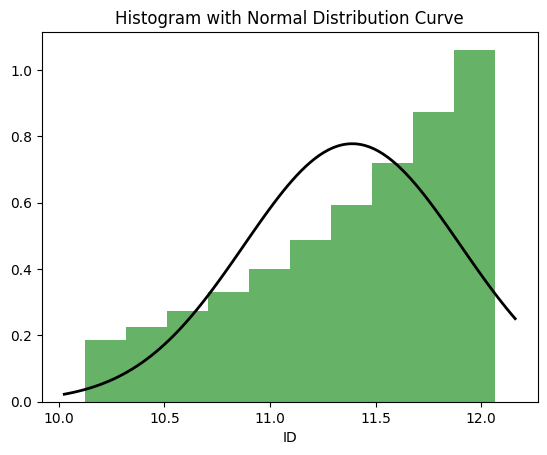

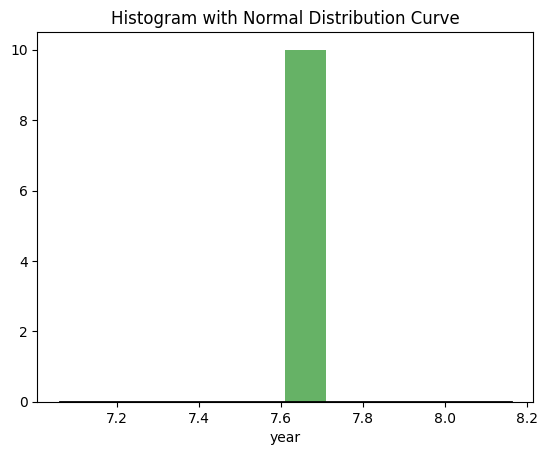

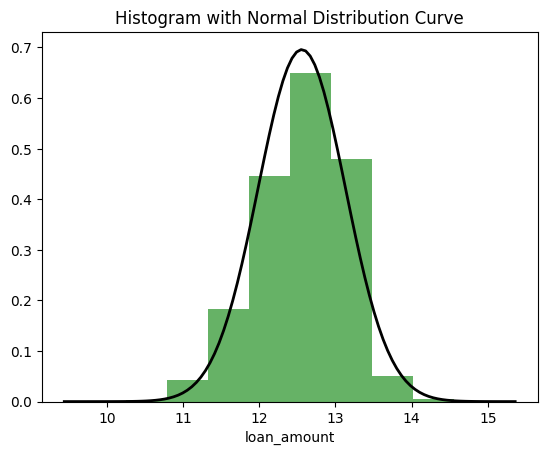

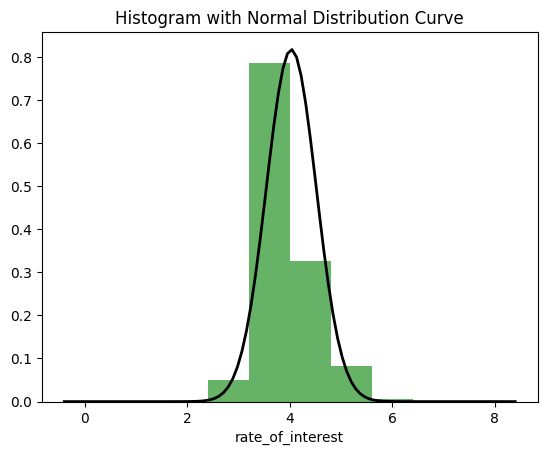

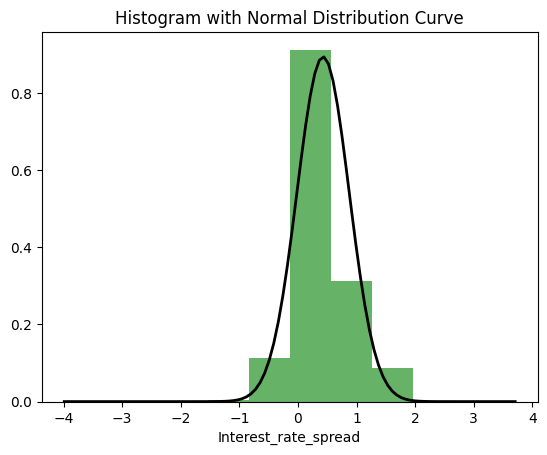

...

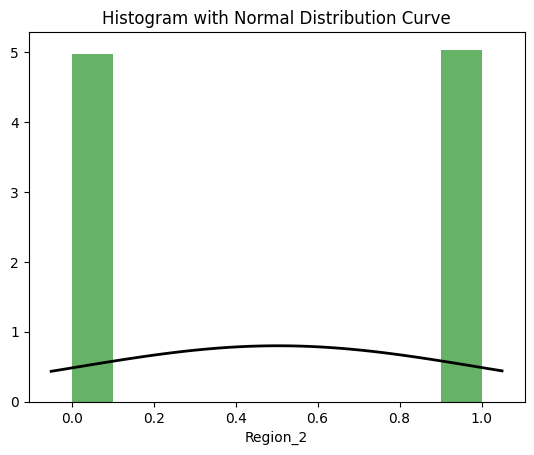

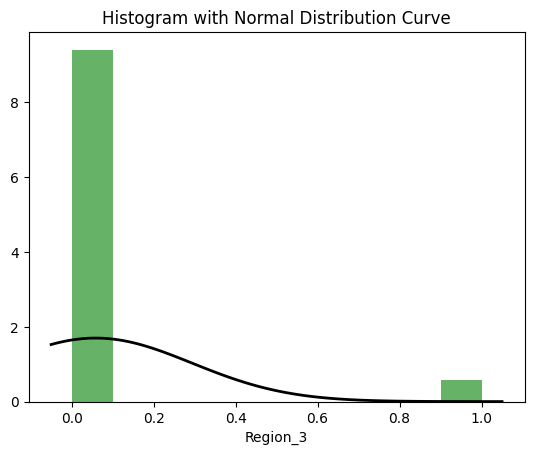

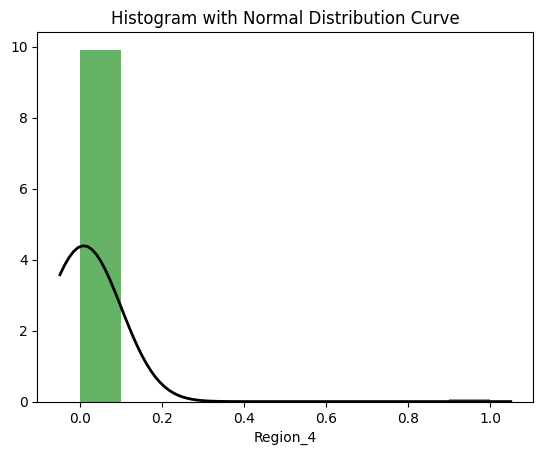

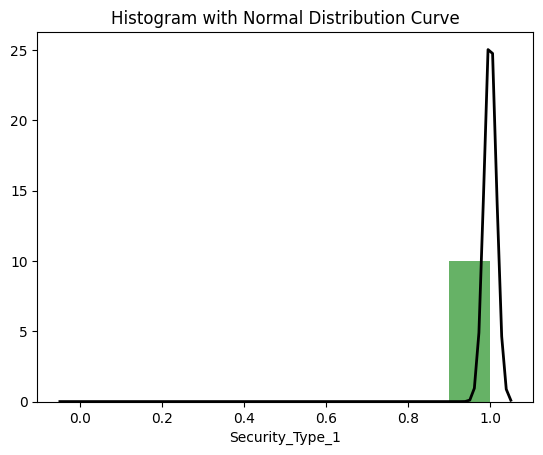

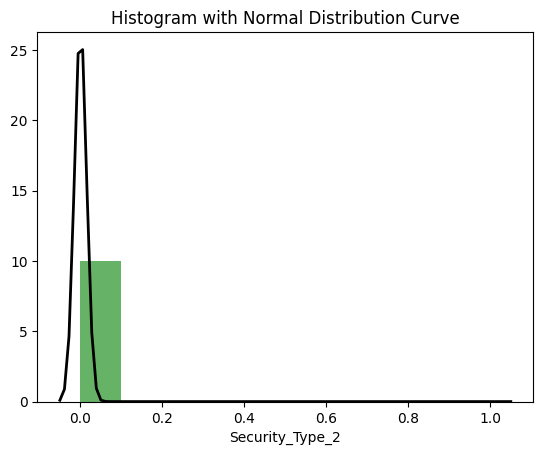

In [ ]:
# Histogram
from scipy.stats import norm
for i in merged_df:
  # calculate mean and standard deviation
  mu, std = norm.fit(merged_df[i])
  # plot histogram with normal distribution curve
  plt.hist(merged_df[i], bins=10, density=True, alpha=0.6, color='g')
  xmin, xmax = plt.xlim()
  x = np.linspace(xmin, xmax, 100)
  p = norm.pdf(x, mu, std)
  plt.plot(x, p, 'k', linewidth=2)
  plt.xlabel(i)
  plt.title("Histogram with Normal Distribution Curve")
  plt.show()

In [ ]:
merged_df.columns

Index(['ID', 'year', 'loan_amount', 'rate_of_interest', 'Interest_rate_spread',
       'Upfront_charges', 'term', 'property_value', 'income', 'Credit_Score',
       'LTV', 'Status', 'dtir1', 'loan_limit_1', 'loan_limit_2', 'Gender_1',
       'Gender_2', 'Gender_3', 'Gender_4', 'approv_in_adv_1',
       'approv_in_adv_2', 'loan_type_1', 'loan_type_2', 'loan_type_3',
       'loan_purpose_1', 'loan_purpose_2', 'loan_purpose_3', 'loan_purpose_4',
       'Credit_Worthiness_1', 'Credit_Worthiness_2', 'open_credit_1',
       'open_credit_2', 'business_or_commercial_1', 'business_or_commercial_2',
       'Neg_ammortization_1', 'Neg_ammortization_2', 'interest_only_1',
       'interest_only_2', 'lump_sum_payment_1', 'lump_sum_payment_2',
       'construction_type_1', 'construction_type_2', 'occupancy_type_1',
       'occupancy_type_2', 'occupancy_type_3', 'Secured_by_1', 'Secured_by_2',
       'total_units_1', 'total_units_2', 'total_units_3', 'total_units_4',
       'credit_type_1', 'credit_ty

**AFTER NORMALIZATION**

**TO DROP**
1. ID(Uniform distribution)
2. year(constant)
3. Credit_score(Uniform)
4. open_credit_1(constant)
5. open_credit_2(constant)
6. construction_type_1(constant)
7. construction_type_2(constant)
8. secured_by_1(constant)
9. secured_by_2(constant)
10. total_units_3(constant)
11. total_units_4(constant)
12. Security_Type_1(constant)
13. Security_Type_2(constant)

**NORMAL Features**
1. loan_amount(10-15)
2. rate_of_interest(2-6)
3. interest_rate_spread(-1-2)
4. property_value(10-16)
5. income(6-12)
6. LTV(2-6)
7. dtir1(near Normal)

**OTHER**
1. Upfront_charges(outliers)
2. term(outliers)
3. other columns

**CORRELATED FEATURES**
1. Strong positive correlation
	1. loan_amoount vs property_value
	2. rate_of_interest vs interest_rate_spread

2. Moderate correlation:
	1. income vs loan_amount
	2. income vs property_value

3.Moderate negative correlation
	1. loan_amount vs interest_rate_spread
	2. property_value vs interest_rate_spread
	3. property_value vs LTV






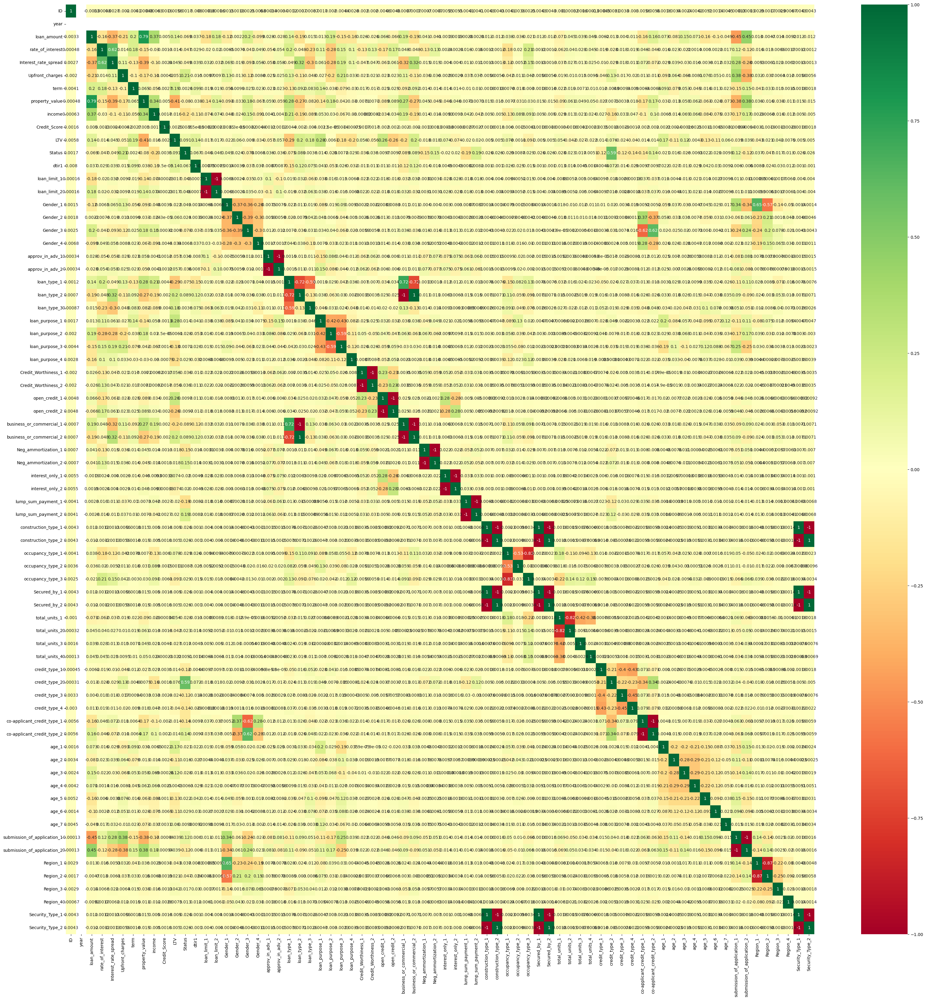

In [ ]:
# Compute the correlation matrix
# no statistically significant correlations between any numeric features...
corrmat = merged_df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(40,40))
#plot heat map
g=sns.heatmap(merged_df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

# **Feature Selection**

**The following correlations are obtained after normalised dataset EDA.**

1. Strong positive correlation(>0.6)
	1. loan_amount vs property_value
	2. rate_of_interest vs interest_rate_spread
	3. business_or_commercial_1 vs loan_type_1
	4. business_or_commercial_2 vs loan_type_2
	5. secured_by_1 vs construction_type_1
	6. secured_by_2 vs construction_type_2
	7. security_type_1 vs construction_type_1
	8. security_type_2 vs construction_type_2
	9. region_1 vs Gender_1
	10. co-applicant_credit_type_2 vs Gender_3

2.Moderate positive correlation(0.3-0.6)

	1. income vs loan_amount
	2. income vs property_value
	3. interest_rate_spread vs loan_type_2
	4. interest_rate_spread vs business_or_commercial_2
	5. submission_of_application_2 vs loan_amount
	6. submission_of_application_2 vs property_value
	7. submission_of_application_1 vs gender_1
	8. submission_of_application_1 vs upfront_charge
	9. co-applicant_credit_type_2 vs credit_type_2
	10. credit_type_2 vs Status
	11. co-applicant_credit_type_1 vs Gender_2


3.Moderate negative correlation(-0.3 to -0.6)

	1. loan_amount vs interest_rate_spread
	2. property_value vs interest_rate_spread
	3. property_value vs LTV
	4. gender_2 vs gender_1
	5. gender_2 vs gender_3
	6. gender_3 vs gender_1
	7. gender_3 vs gender_4
	8. gender_2 vs gender_4
	9. loan_purpose_1 vs loan_purpose_2
	10. loan_purpose_2 vs loan_purpose_3
	11. loan_purpose_1 vs loan_purpose_3
	12. loan_type_3 vs int_rate_spread
	13. loan_type_3 vs loan_type_1
	14. business_or_commercial-1 vs interest_rate_spread
	15. occupancy_type_1 vs occupancy_type_2
	16. total_units_1 vs total_units_3
	17. total_units_1 vs total_units_4
	18. credit_type_3 vs credit_type_1
	19. credit_type_3 vs credit_type_4
	20. credit_type_4 vs credit_type_1
	21. Region_2 vs Gender_1
	22. submission_of_application_2 vs Gender_1
	23. submission_of_application_2 vs upfront_charges
	24. submission_of_application_1 vs loan_amount
	25. submission_of_application_1 vs property_value
	26. co-applicant_credit_type_1 vs credit_type_2
	27. co-applicant_credit_type_2 vs Gender_2

4.Strong negative correlation(<-0.6)

	1. loan_limit_2 vs loan_limit_1
	2. approv_in_adv_1 vs approv_in_adv_2
	3. loan_type_1 vs loan_type_2
	4. Credit_Worthiness_1 vs Credit_Worthiness_2
	5. open_credit_1 vs open_credit_2
	6. business_or_commercial-1 vs business_or_commercial-2
	7. business_or_commercial-1 vs loan_type_2
	8. business_or_commercial-2 vs loan_type_1
	9. Neg_ammortisation_1 vs Neg_ammortisation_2
	10. interest_only_1 vs interest_only_2
	11. lump_sum_payment_1 vs lump_sum_payment_2
	12. construction_type_1 vs construction_type_2
	13. occupancy_type_3 vs occupancy_type_1
	14. construction_type_2  vs secured_by_1
	15. construction_type_1 vs secured_by_2
	16. secured_by_2 vs secured_by_1
	17. total_units_1 vs total_units_2
	18. security_type_1 vs Secured_by_2
	19. security_type_1 vs construction_type_2
	20. security_type_1 vs security_type_2
	21. security_type_2 vs Secured_by_1
	22. security_type_2 vs construction_type_1
	23. security_type_2 vs security_type_1
	24. Region_2 vs Region_1
	25. submission_of_application_2 vs submission_of_application_1
	26. co-applicant_credit_type_1 vs 	co-applicant_credit_type_2
	27. co-applicant_credit_type_1 vs Gender_3


**CONSIDERING STRONGLY CORRELATED FEATURES ONLY**

Strong negative correlation(<-0.6)

	1. loan_limit_2 vs loan_limit_1
	2. approv_in_adv_1 vs approv_in_adv_2
	3. loan_type_1 vs loan_type_2
	4. Credit_Worthiness_1 vs Credit_Worthiness_2
	5. open_credit_1 vs open_credit_2
	6. business_or_commercial-1 vs business_or_commercial-2
	7. business_or_commercial-1 vs loan_type_2
	8. business_or_commercial-2 vs loan_type_1
	9. Neg_ammortisation_1 vs Neg_ammortisation_2
	10. interest_only_1 vs interest_only_2
	11. lump_sum_payment_1 vs lump_sum_payment_2
	12. construction_type_1 vs construction_type_2
	13. occupancy_type_3 vs occupancy_type_1
	14. construction_type_2  vs secured_by_1
	15. construction_type_1 vs secured_by_2
	16. secured_by_2 vs secured_by_1
	17. total_units_1 vs total_units_2
	18. security_type_1 vs Secured_by_2
	19. security_type_1 vs construction_type_2
	20. security_type_1 vs security_type_2
	21. security_type_2 vs Secured_by_1
	22. security_type_2 vs construction_type_1
	23. security_type_2 vs security_type_1
	24. Region_2 vs Region_1
	25. submission_of_application_2 vs submission_of_application_1
	26. co-applicant_credit_type_1 vs 	co-applicant_credit_type_2
	27. co-applicant_credit_type_1 vs Gender_3

Strong positive correlation(>0.6)
  1. loan_amount vs property_value
  2. rate_of_interest vs interest_rate_spread
  3. business_or_commercial_1 vs loan_type_1
  4. business_or_commercial_2 vs loan_type_2
  5. secured_by_1 vs construction_type_1
  6. secured_by_2 vs construction_type_2
  7. security_type_1 vs construction_type_1
  8. security_type_2 vs construction_type_2
  9. region_1 vs Gender_1
  10. co-applicant_credit_type_2 vs Gender_3

**Some featues characteristic based on distribution**
1. ID(Uniform distribution)
2. year(constant)
3. Credit_score(Uniform)
4. open_credit_1(near constant)
5. open_credit_2(near constant)
6. construction_type_1(near constant)
7. construction_type_2(near constant)
8. secured_by_1(near constant)
9. secured_by_2(near constant)
10. total_units_3(near constant)
11. total_units_4(near constant)
12. Security_Type_1(near constant)
13. Security_Type_2(near constant)

**FEATURES TO BE DISCARDED :- **

Features to discard(considering distribution,multicollinearity and banking domain knowledge) are:-

**discard=['ID','year','loan_limit_2','open_credit_2','approv_in_adv_2','loan_type_2','Credit_Worthiness_2',' business_or_commercial-1','business_or_commercial-2','Neg_ammortisation_2',' interest_only_2','lump_sum_payment_2','construction_type_1','occupancy_type_3','secured_by_2','total_units_2',total_units_3','total_units_4','security_type_1','security_type_2','construction_type_2','security_type_2','Region_2','submission_of_application_2','co-applicant_credit_type_2']**


In [ ]:
df_new=merged_df.copy()

In [ ]:
discard=['ID','year','loan_limit_2','open_credit_2','approv_in_adv_2','loan_type_2','Credit_Worthiness_2','business_or_commercial_1','business_or_commercial_2','Neg_ammortization_2','interest_only_2','lump_sum_payment_2','construction_type_1','occupancy_type_3','Secured_by_2','total_units_2','total_units_3','total_units_4','Security_Type_1','Security_Type_2','construction_type_2','Region_2','submission_of_application_2','co-applicant_credit_type_2']

In [ ]:
len(discard)

24

In [ ]:
len(df_new.columns)

72

In [ ]:
df_new.columns

Index(['ID', 'year', 'loan_amount', 'rate_of_interest', 'Interest_rate_spread',
       'Upfront_charges', 'term', 'property_value', 'income', 'Credit_Score',
       'LTV', 'Status', 'dtir1', 'loan_limit_1', 'loan_limit_2', 'Gender_1',
       'Gender_2', 'Gender_3', 'Gender_4', 'approv_in_adv_1',
       'approv_in_adv_2', 'loan_type_1', 'loan_type_2', 'loan_type_3',
       'loan_purpose_1', 'loan_purpose_2', 'loan_purpose_3', 'loan_purpose_4',
       'Credit_Worthiness_1', 'Credit_Worthiness_2', 'open_credit_1',
       'open_credit_2', 'business_or_commercial_1', 'business_or_commercial_2',
       'Neg_ammortization_1', 'Neg_ammortization_2', 'interest_only_1',
       'interest_only_2', 'lump_sum_payment_1', 'lump_sum_payment_2',
       'construction_type_1', 'construction_type_2', 'occupancy_type_1',
       'occupancy_type_2', 'occupancy_type_3', 'Secured_by_1', 'Secured_by_2',
       'total_units_1', 'total_units_2', 'total_units_3', 'total_units_4',
       'credit_type_1', 'credit_ty

In [ ]:
discard

['ID',
 'year',
 'loan_limit_2',
 'open_credit_2',
 'approv_in_adv_2',
 'loan_type_2',
 'Credit_Worthiness_2',
 'business_or_commercial_1',
 'business_or_commercial_2',
 'Neg_ammortization_2',
 'interest_only_2',
 'lump_sum_payment_2',
 'construction_type_1',
 'occupancy_type_3',
 'Secured_by_2',
 'total_units_2',
 'total_units_3',
 'total_units_4',
 'Security_Type_1',
 'Security_Type_2',
 'construction_type_2',
 'Region_2',
 'submission_of_application_2',
 'co-applicant_credit_type_2']

In [ ]:
#New dataframe after feature selection
df_new  = df_new.drop(discard, axis=1)

In [ ]:
df_new.head()

,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,property_value,income,Credit_Score,LTV,Status,dtir1,loan_limit_1,Gender_1,Gender_2,Gender_3,Gender_4,approv_in_adv_1,loan_type_1,loan_type_3,loan_purpose_1,loan_purpose_2,loan_purpose_3,loan_purpose_4,Credit_Worthiness_1,open_credit_1,Neg_ammortization_1,interest_only_1,lump_sum_payment_1,occupancy_type_1,occupancy_type_2,Secured_by_1,total_units_1,credit_type_1,credit_type_2,credit_type_3,credit_type_4,co-applicant_credit_type_1,age_1,age_2,age_3,age_4,age_5,age_6,age_7,submission_of_application_1,Region_1,Region_3,Region_4
0,11.665655,3.99,0.3901,7.863392,5.888878,11.678448,7.462215,6.632002,4.602455,1,3.828641,1,1,0,0,0,1,1,0,1,0,0,0,1,1,1,1,1,1,0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0
1,12.238061,3.99,0.3901,7.863392,5.888878,12.943239,8.513386,6.315358,4.332345,1,3.688879,1,0,1,0,0,1,0,0,1,0,0,0,1,1,1,1,0,1,0,1,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0
2,12.915342,4.56,0.2000,6.390241,5.888878,13.138239,9.157045,6.727432,4.394692,0,3.850148,1,0,1,0,0,0,1,0,1,0,0,0,1,1,0,1,1,1,0,1,1,1,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0
3,13.031346,4.25,0.6810,7.863392,5.888878,13.396962,9.382696,6.376727,4.253865,0,3.761200,1,0,1,0,0,1,1,0,0,1,0,0,1,1,1,1,1,1,0,1,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
4,13.453825,4.00,0.3042,0.000000,5.888878,13.538440,9.253496,6.401917,4.531379,0,3.688879,1,0,0,1,0,0,1,0,1,0,0,0,1,1,1,1,1,1,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0


# **Feature Scaling**

**MIN-MAX Scaling the features to bring features to same scale**

In [ ]:
# Min-Max Scaling
scaler_minmax = MinMaxScaler()
df_final = pd.DataFrame(scaler_minmax.fit_transform(df_new), columns=df_new.columns)

# Print the original and scaled DataFrames
print("Original DataFrame:")
print(df_new)
print("\nMin-Max Scaling:")
print(df_final)

Original DataFrame:
        loan_amount  rate_of_interest  Interest_rate_spread  Upfront_charges  \
0         11.665655             3.990                0.3901         7.863392   
1         12.238061             3.990                0.3901         7.863392   
2         12.915342             4.560                0.2000         6.390241   
3         13.031346             4.250                0.6810         7.863392   
4         13.453825             4.000                0.3042         0.000000   
...             ...               ...                   ...              ...   
148665    12.986546             3.125                0.2571         9.206433   
148666    13.281930             5.190                0.8544         0.000000   
148667    13.009197             3.125                0.0816         7.112849   
148668    12.188423             3.500                0.5824         8.372012   
148669    12.915342             4.375                1.3871         8.699681   

            term  p

In [ ]:
#Final dataframe for machine learning models
df_final.head()

,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,property_value,income,Credit_Score,LTV,Status,dtir1,loan_limit_1,Gender_1,Gender_2,Gender_3,Gender_4,approv_in_adv_1,loan_type_1,loan_type_3,loan_purpose_1,loan_purpose_2,loan_purpose_3,loan_purpose_4,Credit_Worthiness_1,open_credit_1,Neg_ammortization_1,interest_only_1,lump_sum_payment_1,occupancy_type_1,occupancy_type_2,Secured_by_1,total_units_1,credit_type_1,credit_type_2,credit_type_3,credit_type_4,co-applicant_credit_type_1,age_1,age_2,age_3,age_4,age_5,age_6,age_7,submission_of_application_1,Region_1,Region_3,Region_4
0,0.363373,0.49875,0.575854,0.714716,1.0,0.352609,0.562408,0.707780,0.473589,1.0,0.872186,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
1,0.469793,0.49875,0.575854,0.714716,1.0,0.518331,0.641632,0.168260,0.441004,1.0,0.812341,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.595712,0.57000,0.548678,0.580819,1.0,0.543881,0.690143,0.870381,0.448525,0.0,0.881395,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
3,0.617279,0.53125,0.617441,0.714716,1.0,0.577780,0.707150,0.272825,0.431536,0.0,0.843308,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.695825,0.50000,0.563574,0.000000,1.0,0.596318,0.697412,0.315746,0.465015,0.0,0.812341,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# **Model Selection and Training**

**Data Splitting: Divide data into various proportions for training and testing i.e 80:20, 70:30, 90:10, 80:10:10, 90:5:5**

In [ ]:
#Input Features (X) and output feature (y) for Machine Learning models
X=df_final.loc[ : , df_final.columns != 'Status'].copy()
y=df_final['Status'].copy()

In [ ]:
#Importing libraries and packages
from sklearn.model_selection import train_test_split

In [ ]:
#Test-Train data splitting
X = X.copy()
y = y.copy()
X_train, X_test, y_train, y_test = train_test_split( X,y , test_size = 0.2, random_state = 42)
print(X_train.shape)
print(X_test.shape)

(117819, 47)
(29455, 47)


In [ ]:
y_train.value_counts()

Status
0.0    88953
1.0    28866
Name: count, dtype: int64

In [ ]:
y_test.value_counts()

Status
0.0    22197
1.0     7258
Name: count, dtype: int64

# **Logistic Regression**

In [ ]:
#Logistics Regression-Importing Libraries and Packages
from sklearn.linear_model import LogisticRegression

In [ ]:
#Fitting Logistic Regression
clf = LogisticRegression(solver='lbfgs', max_iter=500)
clf.fit(X_train, y_train)

LogisticRegression(max_iter=500)

In [ ]:
# Get the model coefficients and intercept
print(clf.coef_)
print(clf.intercept_)

[[ 2.32361354  0.90515349 -8.90394325  3.01854917 -0.52361178 -2.37819956
  -8.55893592  0.06391921  4.90966656  0.11157504 -0.79120413 -0.0540325
   0.11518242 -0.02332697 -0.05955024  0.21747003 -1.18738146 -1.79562691
  -0.30718977 -0.11864285 -0.16349357  0.5675989  -0.45910252 -0.5539786
  -1.10336302 -0.27166967 -2.65897798 -1.09532566 -0.34024406 -3.4962973
  -0.62850498 -2.33265882  6.94229881 -2.30063228 -2.330735    0.16033509
  -0.16568432  0.03710362 -0.13028192  0.01464154 -0.03652064  0.04527587
   0.21373856  0.47861854  0.21562119  0.28428318  0.29992597]]
[18.27280665]


In [ ]:
# Get the predicted probabilities
train_preds = clf.predict_proba(X_train)
test_preds = clf.predict_proba(X_test)

In [ ]:
# Get the predicted classes
train_class_preds = clf.predict(X_train)
test_class_preds = clf.predict(X_test)

[[87724  1229]
 [13679 15187]]


[Text(0, 0.5, 'Repaid'), Text(0, 1.5, 'Defaulted')]

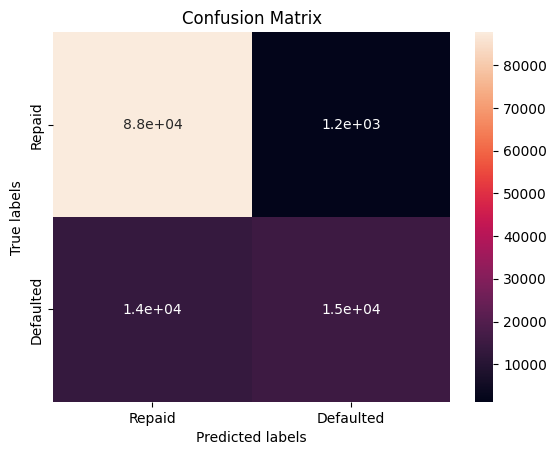

In [ ]:
# Get the confusion matrix for train data
from sklearn.metrics import confusion_matrix
import seaborn as sns

labels = ['Repaid', 'Defaulted']
cm = confusion_matrix(y_train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax) #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[21863   334]
 [ 3464  3794]]


[Text(0, 0.5, 'Repaied'), Text(0, 1.5, 'Defaulted')]

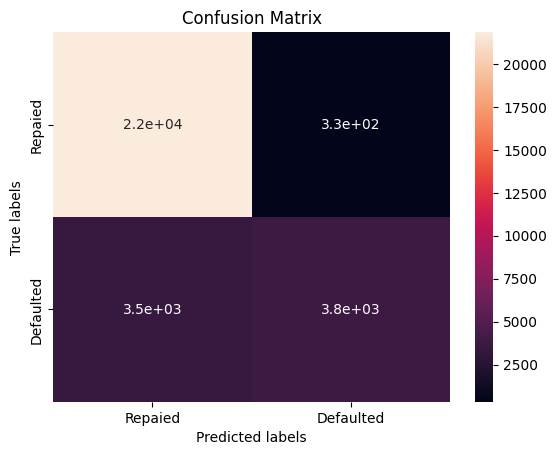

In [ ]:
# Get the confusion matrix test data

labels = ['Repaied', 'Defaulted']
cm = confusion_matrix(y_test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

**Model Evaluation Metrics**

In [ ]:
#Accuracy
from sklearn.metrics import accuracy_score
# Get the accuracy scores
test_accuracy = accuracy_score(y_test,test_class_preds)
print("The accuracy on test data is ", test_accuracy)
train_accuracy = accuracy_score(y_train, train_class_preds)
print("The accuracy on training data is ", train_accuracy)

The accuracy on test data is  0.8710575454082499
The accuracy on training data is  0.8734669280846044


In [ ]:
#Precision
from sklearn.metrics import precision_score
# Get the precision scores
test_precision = precision_score(y_test,test_class_preds)
print("The precision on test data is ", test_precision)

The precision on test data is  0.9190891472868217


In [ ]:
#Recall/Senstivity
from sklearn.metrics import recall_score
# Get the recall scores
test_recall = recall_score(y_test,test_class_preds)
print("The recall on test data is ", test_recall)

The recall on test data is  0.5227335354092036


In [ ]:
#F1 score
from sklearn.metrics import f1_score
# Get the f1 scores
test_f1 = f1_score(y_test,test_class_preds)
print("The f1 score on test data is ", test_f1)

The f1 score on test data is  0.6664324609169155


In [ ]:
#Log Loss
from sklearn.metrics import log_loss
# Get the log_loss scores
test_log_loss = log_loss(y_test,test_preds[:,1])
print("The log_loss score on test data is ", test_log_loss)

The log_loss score on test data is  0.32867653489430604


In [ ]:
#AUC-ROC Score
from sklearn.metrics import roc_auc_score
# Get the roc_auc_score scores
test_roc_auc_score = roc_auc_score(y_test,test_preds[:,1])
print("The roc_auc_score on test data is ", test_roc_auc_score)

The roc_auc_score on test data is  0.8624094140456472


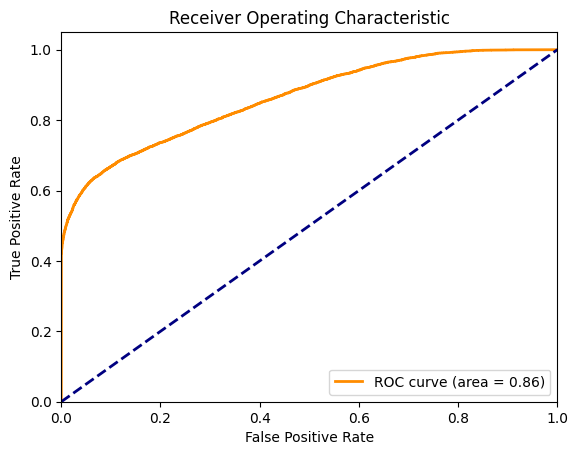

In [ ]:
#Plotting ROC-AUC curve
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Assuming you already have your model predictions (probabilities)
# For example, using: predictions = model.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, test_preds[:,1])

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plotting
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [ ]:
#Finding optimal cutoff from above curve, to get max TPR/FPR ratio
thresholds[np.argmax(tpr-fpr)]

0.2897528395386647

**The problem needs to reduce FNR as much as possible.**AS FNR=1-TPR, SO For least FNR, we have to maximise TPR

In [ ]:
import numpy as np
optimal_threshold = thresholds[np.argmin((1 - tpr) ** 2 + fpr ** 2)]
print(f"The optimal cutoff point is approximately {optimal_threshold:.6f}")


The optimal cutoff point is approximately 0.216147


In [ ]:
# Predict probabilities on the test set
y_proba = clf.predict_proba(X_test)[:, 1]

# Set a threshold (initially 0.5)
threshold = 0.5

# Adjust threshold based on your criteria (e.g., maximizing F1-score, maximize recall)
while threshold >= 0:
    y_pred = (y_proba >= threshold).astype(int)
    f1 = f1_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    acc=accuracy_score(y_test, y_pred)

    print(f"Threshold: {threshold:.2f}, F1 Score: {f1:.4f}, Recall: {recall:.4f}, Accuracy: {acc:.4f}")

    # Move the threshold (you can customize the step size)
    threshold -= 0.02

Threshold: 0.50, F1 Score: 0.6664, Recall: 0.5227, Accuracy: 0.8711
Threshold: 0.48, F1 Score: 0.6699, Recall: 0.5310, Accuracy: 0.8711
Threshold: 0.46, F1 Score: 0.6730, Recall: 0.5397, Accuracy: 0.8708
Threshold: 0.44, F1 Score: 0.6803, Recall: 0.5540, Accuracy: 0.8717
Threshold: 0.42, F1 Score: 0.6840, Recall: 0.5650, Accuracy: 0.8713
Threshold: 0.40, F1 Score: 0.6881, Recall: 0.5781, Accuracy: 0.8709
Threshold: 0.38, F1 Score: 0.6905, Recall: 0.5918, Accuracy: 0.8693
Threshold: 0.36, F1 Score: 0.6932, Recall: 0.6077, Accuracy: 0.8675
Threshold: 0.34, F1 Score: 0.6939, Recall: 0.6229, Accuracy: 0.8646
Threshold: 0.32, F1 Score: 0.6912, Recall: 0.6359, Accuracy: 0.8600
Threshold: 0.30, F1 Score: 0.6849, Recall: 0.6478, Accuracy: 0.8531
Threshold: 0.28, F1 Score: 0.6795, Recall: 0.6634, Accuracy: 0.8458
Threshold: 0.26, F1 Score: 0.6717, Recall: 0.6819, Accuracy: 0.8357
Threshold: 0.24, F1 Score: 0.6579, Recall: 0.6987, Accuracy: 0.8210
Threshold: 0.22, F1 Score: 0.6421, Recall: 0.718

**Considering Accuracy,Recall and F1 score together, Threshold of 0.22 is apt, given it yield highest accuracy of 80.27% at sufficiently high recall 0.7180 and F1 score of 0.6421.**However, considering the trade-off:- Higher recall means capturing more defaulters but accepting more false positives, while higher precision reduces false positives but may miss some defaulters. The choice depends on the organization’s risk tolerance and cost implications.

# **Decision Tree**

In [ ]:
#Imorting Library and Packages
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, log_loss, recall_score, precision_score, f1_score, roc_auc_score

In [ ]:
#Train Decision Tree model
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
train_predictions = model.predict(X_train)

In [ ]:
test_predictions = model.predict(X_test)

In [ ]:
# Measure Training Accuracy of the Classifier
print("Accuracy:", accuracy_score(y_train, train_predictions) * 100)

Accuracy: 100.0


In [ ]:
# Measure Testing Accuracy of the Classifier
print("Accuracy:", accuracy_score(y_test, test_predictions) * 100)

Accuracy: 99.99660499066373


In [ ]:
# Measure ROC_AUC of the Classifier on train set
print("ROC_AUC_Train:", roc_auc_score(y_train, train_predictions))

ROC_AUC_Train: 1.0


In [ ]:
#Evaluating model by recall, precision, f1_score
precision = precision_score(y_test, test_predictions)
recall = recall_score(y_test, test_predictions)
f1 = f1_score(y_test, test_predictions)
print(f"Precision:{precision}, Recall:{recall}, F1_score:{f1}")

Precision:0.9998622399779584, Recall:1.0, F1_score:0.9999311152441964


In [ ]:
#Log_loss
y_prob = model.predict_proba(X_test)[:, 1]  # Probability of positive class
from sklearn.metrics import log_loss

log_loss_value = log_loss(y_test, y_prob)
print(f"log_loss:{log_loss_value}")

log_loss:0.001223685397695593


In [ ]:
# Measure ROC_AUC of the Classifier on test set
roc_auc = roc_auc_score(y_test, y_prob)
print(f"ROC_AUC:{roc_auc}")

ROC_AUC:0.9999774744334821


# **Random Forest Classifier with tuning hyperparameters**

In [ ]:
#Importing library and packages
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, confusion_matrix, accuracy_score


**1. Split the dataset into train and test using stratified sampling on our dependent variable.**

**2. Using a stratified sampling ensures the distribution of dependent variable remains same across train and test datasets.**


In [ ]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)


In [ ]:
print("The shape of train dataset :")
print(X_train.shape)

print("\n The shape of test dataset :")
print(X_test.shape)

The shape of train dataset :
(117819, 47)

 The shape of test dataset :
(29455, 47)


In [ ]:
print("Distribution of classes of dependent variable in train :")
print(y_train.value_counts())

print("\n Distribution of classes of dependent variable in test :")
print(y_test.value_counts())

Distribution of classes of dependent variable in train :
Status
0.0    88920
1.0    28899
Name: count, dtype: int64

 Distribution of classes of dependent variable in test :
Status
0.0    22230
1.0     7225
Name: count, dtype: int64


In [ ]:
# Build Random Forest Model and Hyperparameter tuning

classifier = RandomForestClassifier()
grid_values = {'n_estimators':[50, 80,  100], 'max_depth':[3, 5, 7]}
classifier = GridSearchCV(classifier, param_grid = grid_values, scoring = 'roc_auc', cv=5)


In [ ]:
# Fit the object to train dataset
classifier=classifier.fit(X_train, y_train)

In [ ]:
#Predicting on both train and test dataset using the fitted model
train_preds =  classifier.predict(X_train)
test_preds  = classifier.predict(X_test)

# Obtain accuracy on train set
accuracy_score(y_train,train_preds)

0.9777540125107156

In [ ]:
# Obtain accuracy on test set
accuracy_score(y_test,test_preds)

0.9775589882872178

In [ ]:
#Recall value
recall_score(y_test,test_preds)

0.9085121107266436

In [ ]:
#Precision value
precision_score(y_test,test_preds)

1.0

In [ ]:
# Obtain the confusion matrix on train set
confusion_matrix(y_train,train_preds)


array([[88920,     0],
       [ 2621, 26278]])

In [ ]:
# Obtain the confusion matrix on test set
confusion_matrix(y_test,test_preds)

array([[22230,     0],
       [  661,  6564]])

In [ ]:
# Get the predicted probabilities
train_preds = classifier.predict_proba(X_train)
test_preds = classifier.predict_proba(X_test)

In [ ]:
# Get the roc_auc_score scores
test_roc_auc_score = roc_auc_score(y_test,test_preds[:,1])
print("The roc_auc_score on test data is ", test_roc_auc_score)

The roc_auc_score on test data is  1.0


In [ ]:
#Get the log_loss value
log_loss(y_test,test_preds[:,1])

0.1683115880573597

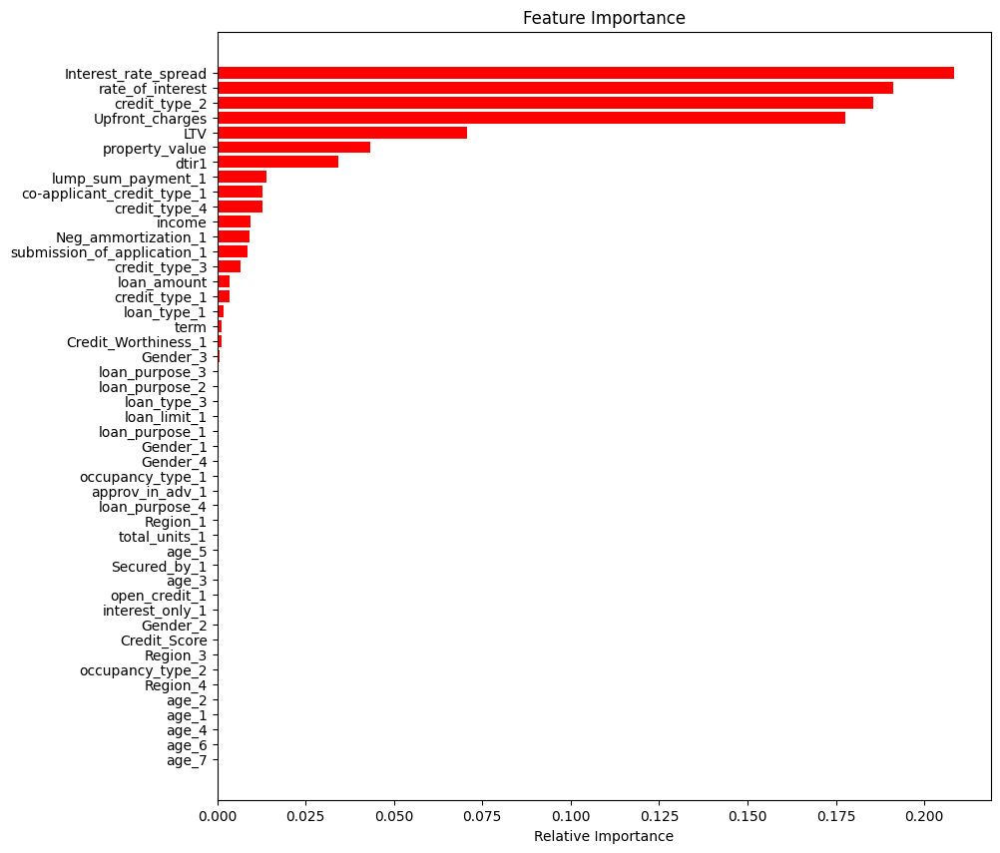

In [ ]:
# Plot feature importance as per grid search
from pylab import rcParams
rcParams['figure.figsize'] = 10, 10
features = X_train.columns
importances = classifier.best_estimator_.feature_importances_
indices = np.argsort(importances)


plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Gradient Boosting Classifier with tuning hyperparameters**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
classifier = GradientBoostingClassifier()
grid_values = {'n_estimators':[50, 80,  100], 'max_depth':[3, 5, 7]}
classifier = GridSearchCV(classifier, param_grid = grid_values, scoring = 'roc_auc', cv=5)

# Fit the object to train dataset
classifier=classifier.fit(X_train, y_train)


In [ ]:
#Predicting on both train and test dataset using the fitted model


train_preds =  classifier.predict(X_train)
test_preds  = classifier.predict(X_test)

In [ ]:
# Obtain accuracy on train set
accuracy_score(y_train,train_preds)

0.9998896612600684

In [ ]:
# Obtain accuracy on test set
accuracy_score(y_test,test_preds)

0.9998641996265489

In [ ]:
# Obtain the confusion matrix on train set
confusion_matrix(y_train,train_preds)

array([[88940,    13],
       [    0, 28866]])

In [ ]:
# Obtain the confusion matrix on test set
confusion_matrix(y_test,test_preds)

array([[22193,     4],
       [    0,  7258]])

In [ ]:
#Recall value
recall_score(y_test,test_preds)

1.0

In [ ]:
#Precision value
precision_score(y_test,test_preds)

0.9994491875516387

In [ ]:
#F1 Score
f1_score(y_test,test_preds)

0.9997245179063361

In [ ]:
# Get the predicted probabilities
train_preds = classifier.predict_proba(X_train)
test_preds = classifier.predict_proba(X_test)

In [ ]:
# Get the roc_auc_score scores
test_roc_auc_score = roc_auc_score(y_test,test_preds[:,1])
print("The roc_auc_score on test data is ", test_roc_auc_score)

The roc_auc_score on test data is  0.9999641105468153


In [ ]:
#Get the log_loss value
log_loss(y_test,test_preds[:,1])

0.003204142739299956

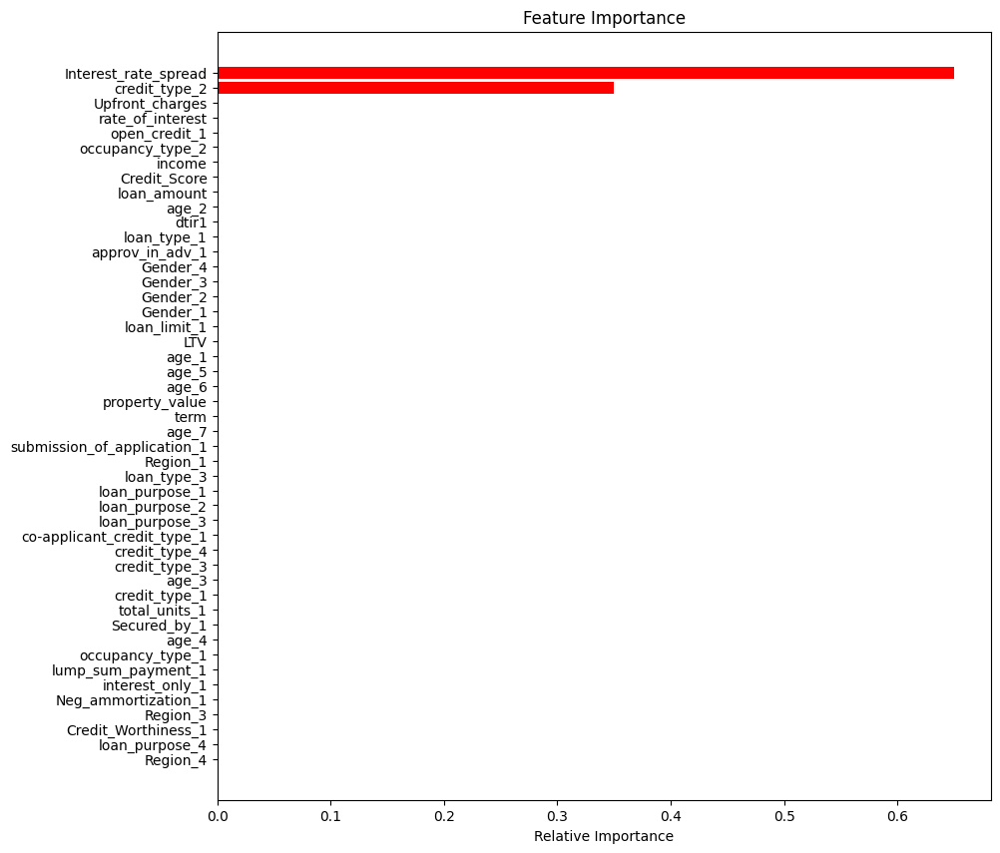

In [ ]:
#Plot the variable importance


features = X_train.columns
importances = classifier.best_estimator_.feature_importances_
indices = np.argsort(importances)


plt.title('Feature Importance')
plt.barh(range(len(indices)), importances[indices], color='red', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')

plt.show()

# **Neural Network-MLP Classifier**

In [ ]:
from sklearn.neural_network import MLPClassifier

In [ ]:
# Build and configure the MLPClassifier
model = MLPClassifier(hidden_layer_sizes=(100, 50, 25), activation='relu', solver='adam', max_iter=400, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Evaluate the model on the test set
accuracy = model.score(X_test, y_test)
print(f'Test accuracy: {accuracy}')

Test accuracy: 0.9871668647088779


In [ ]:
#Getting predictions
y_train_pred=model.predict(X_train)
y_test_pred=model.predict(X_test)

In [ ]:
#Train accuracy
acc_t=model.score(X_train, y_train)
print(f'Train accuracy: {acc_t}')

Train accuracy: 0.989084952342152


In [ ]:
#Evaluating model by recall, precision, f1_score
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)
print(f"Precision:{precision}, Recall:{recall}, F1_score:{f1}")

Precision:0.9661246612466124, Recall:0.9823642876825571, F1_score:0.9741768001093045


In [ ]:
#Log_loss
y_prob = model.predict_proba(X_test)[:, 1]  # Probability of positive class
from sklearn.metrics import log_loss

log_loss_value = log_loss(y_test, y_prob)
print(f"log_loss:{log_loss_value}")

log_loss:0.041511797728495635


In [ ]:
#ROC-AUC
from sklearn.metrics import roc_auc_score

roc_auc = roc_auc_score(y_test, y_prob)
print(f"ROC_AUC:{roc_auc}")

ROC_AUC:0.998341779396606


# **Model Assessment and final remarks**

**Logistic Regression**
1. The accuracy on training data is  0.8734669280846044
2. The accuracy on test data is  0.8710575454082499
3. The precision on test data is  0.9190891472868217
4. The recall on test data is  0.5227335354092036
5. The f1 score on test data is  0.6664324609169155
6. The log_loss score on test data is  0.32867653489430604
7. The roc_auc_score on test data is  0.8624094140456472

**Decision Tree**
1. Training Accuracy: 1
2. Test Accuracy: 0.9999660499066373
3. Precision: 0.9998622399779584
4. Recall: 1.0
5. F1_score: 0.9999311152441964
6. log_loss: 0.001223685397695593
7. ROC_AUC: 0.9999774744334821


**Random Forest Classifier**
1. Training accuracy: 0.9777540125107156
2. Test accurcay: 0.9775589882872178
3. Precison: 1
4. Recall: 0.9085121107266436
5. F1_score: 0.952063238813547
6. ROC_AUC: 1
7. log_loss: 0.1683115880573597


**Gradient Boosting Classifier**
1. Training dataset accuracy : 0.9998896612600684
2. Testing dataset accuracy : 0.9998641996265489
3. Precison : 0.9994491875516387
4. Recall	: 1
5. F1 Score : 0.9997245179063361
6. ROC_AUC Test data : 0.9999641105468153
7. Log_loss : 0.003204142739299956


**Neural Network-MLP Classifier**
1. Train accuracy: 0.989084952342152
2. Test accuracy: 0.9871668647088779
3. Precision:0.9661246612466124
4. Recall:0.9823642876825571
5. F1_score:0.9741768001093045
6. log_loss:0.041511797728495635
7. ROC_AUC:0.998341779396606


So, **best models according to evaluation metrics** are:-
1. **Train Accuracy**:- 1(Decision Tree) which is overfitted, so Gradient Boosting Classifier(GBS) has second best result.
2. **Test Accuracy**:- Decision Tree
3. **Precision**:- Random Forest
4. **Recall**:- Decision Tree, Gradient Boosting Classification
5. **F1 score**:- Decision Tree
6. **log_loss**:- Decision Tree
7. **ROC_AUC**:- Random Forest


**Analyzing the results:**

**Logistic Regression:**
1. The model achieves decent accuracy on both training and test data.
2. Precision (positive predictive value) is high, indicating that when it predicts a default, it’s usually correct.
3. Recall (true positive rate) is moderate, suggesting it captures about half of the actual defaults.
4. F1-score balances precision and recall.
5. ROC AUC score is reasonable, but there’s room for improvement.

**Decision Tree:**
1. Surprisingly high training accuracy (1), which could indicate overfitting.
2. Excellent test accuracy, precision, recall, and F1-score.
3. Very low log-loss, indicating confident predictions.
4. High ROC AUC score, suggesting good separation between classes.

**Random Forest Classifier:**
1. High training accuracy but slightly lower test accuracy.
2. Perfect precision (which can be suspicious) and good recall.
3. High F1-score, indicating a balanced trade-off.
4. Excellent ROC AUC score.

**Gradient Boosting Classifier:**
1. High training and testing accuracy.
2. Very high precision and recall.
3. Impressive F1-score.
4. Excellent ROC AUC score.

**Neural Network (MLP) Classifier:**
1. Good training and test accuracy.
2. Balanced precision and recall.
3. Solid F1-score.
4. High ROC AUC score.

Overall, the **Gradient Boosting Classifier** seems to perform exceptionally well, striking a **balance between precision and recall. **.However, it is **slow**.So, Neural Network may serve the purpose perfectly with further hyperparameter tuning.But it is computationally **resource intensive**.Alternatively, we can try more varients of Gradient Boosting like XGBoost, LGBoost etc.It may **help best to identify prospective loan defaults.**